# Машинное обучение, ФКН ВШЭ

## Практическое задание 2. Exploratory Data Analysis и линейная регрессия

### Общая информация
Дата выдачи: 05.10.2023

Мягкий дедлайн: 23:59MSK 18.10.2023

Жесткий дедлайн: 23:59MSK 22.10.2022

### О задании
В этом задании мы попытаемся научиться анализировать данные и выделять из них полезные признаки. Мы также научимся пользоваться `seaborn` и `sklearn`, а заодно привыкнем к основным понятиям машинного обучения.

### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов. Проверяющий имеет право снизить оценку за неэффективную реализацию или неопрятные графики.

**Обратите внимание**, что в каждом разделе домашнего задания есть оцениваниемые задачи и есть вопросы. Вопросы дополняют задачи и направлены на то, чтобы проинтерпретировать или обосновать происходящее. Код без интерпретации не имеет смысла, поэтому отвечать на вопросы обязательно — за отсутствие ответов мы будем снижать баллы за задачи. Если вы ответите на вопросы, но не напишете корректный код к соответствующим оцениваемым задачам, то баллы за такое выставлены не будут.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

### Формат сдачи
Задания сдаются через систему Anytask. Инвайт можно найти на странице курса. Присылать необходимо ноутбук с выполненным заданием. Сам ноутбук называйте в формате homework-practice-02-linregr-Username.ipynb, где Username — ваша фамилия.

Для удобства проверки самостоятельно посчитайте свою максимальную оценку (исходя из набора решенных задач) и укажите ниже.

Оценка: xx.

В этом ноутбуке используется библиотека `folium` для визуализации карт. Она работает в google colab!

In [29]:
# !pip install folium

In [30]:
import folium

m = folium.Map(location=(55.7522200, 37.6155600), zoom_start=10)

m

Если вы всё сделали правильно, то выше должна открыться карта Москвы.

In [31]:
import warnings

warnings.filterwarnings('ignore')

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

sns.set(style="darkgrid")

np.random.seed(0)

## Часть 0. Подготовка (1 балл)

**Задание 1 (1 балл)**. Мы будем работать с данными из соревнования [New York City Taxi Trip Duration](https://www.kaggle.com/c/nyc-taxi-trip-duration/overview), в котором нужно было предсказать длительность поездки на такси. Скачайте обучающую выборку из этого соревнования и загрузите ее:

In [33]:
train = pd.read_csv('/Users/timurkin/Desktop/моп/hw2/train.csv')
train.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


In [34]:
task_1 = train.copy()
task_1.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


Обратите внимание на колонки `pickup_datetime` и `dropoff_datetime`. `dropoff_datetime` был добавлена организаторами только в обучающую выборку, то есть использовать эту колонку нельзя, давайте удалим ее. В `pickup_datetime` записаны дата и время начала поездки. Чтобы с ней было удобно работать, давайте преобразуем даты в `datetime`-объекты

In [35]:
task_1 = task_1.drop(columns = ['dropoff_datetime'])
task_1['pickup_datetime'] = pd.to_datetime(task_1['pickup_datetime'])
task_1.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,435


In [36]:
task_1.dtypes

id                            object
vendor_id                      int64
pickup_datetime       datetime64[ns]
passenger_count                int64
pickup_longitude             float64
pickup_latitude              float64
dropoff_longitude            float64
dropoff_latitude             float64
store_and_fwd_flag            object
trip_duration                  int64
dtype: object

В колонке `trip_duration` записано целевое значение, которое мы хотим предсказывать. Давайте посмотрим на распределение таргета в обучающей выборке. Для этого нарисуйте его гистограмму:

In [37]:
max_dur = task_1.sort_values(by = 'trip_duration', ascending = False)
max_dur

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
978383,id0053347,1,2016-02-13 22:46:52,1,-73.783905,40.648632,-73.978271,40.750202,N,3526282
924150,id1325766,1,2016-01-05 06:14:15,1,-73.983788,40.742325,-73.985489,40.727676,N,2227612
680594,id0369307,1,2016-02-13 22:38:00,2,-73.921677,40.735252,-73.984749,40.759979,N,2049578
355003,id1864733,1,2016-01-05 00:19:42,1,-73.789650,40.643559,-73.956810,40.773087,N,1939736
1234291,id1942836,2,2016-02-15 23:18:06,2,-73.794525,40.644825,-73.991051,40.755573,N,86392
...,...,...,...,...,...,...,...,...,...,...
269418,id0553321,2,2016-04-11 19:01:35,1,-73.945999,40.792202,-73.947411,40.792740,N,1
467645,id0008221,2,2016-05-16 14:42:18,1,-73.787086,40.647388,-73.789780,40.646992,N,1
533799,id3563137,2,2016-04-15 17:32:22,1,-73.782417,40.644154,-73.782433,40.644169,N,1
726971,id2697717,2,2016-03-27 12:55:52,2,-73.983154,40.767159,-73.983238,40.767097,N,1


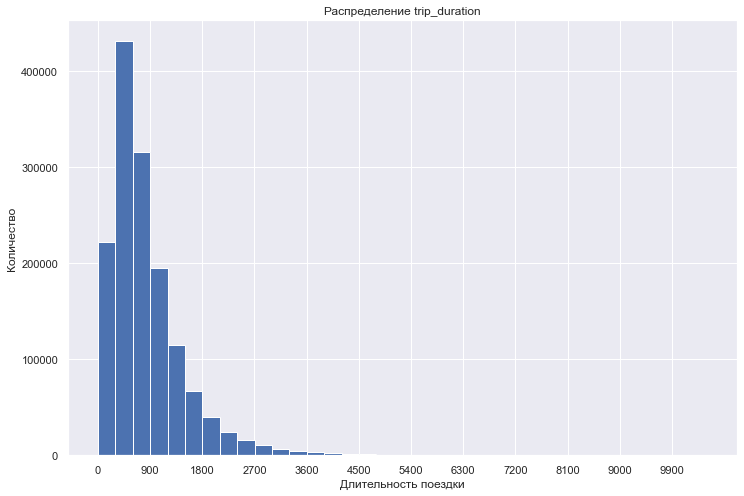

In [38]:
# разобъем длительность поездки по 5-минутам и до максимального значения, равного 3 часам
plt.figure(figsize=(12, 8))
plt.hist(task_1['trip_duration'], bins = range(1, 10800, 300))
plt.xlabel('Длительность поездки')
plt.xticks(range(0, 10800, 900)) # подписал значения каждые 15 минут
plt.ylabel('Количество')
plt.title('Распределение trip_duration')
plt.show()

**Вопрос**: Что можно сказать о целевой переменной по гистограмме её значений?

В соревновании в качестве метрики качества использовалось RMSLE:
$$\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2}$$

**Вопрос**: Как вы думаете, почему авторы соревнования выбрали именно RMSLE, а не RMSE?

Если посмотреть на длительность поездок, то можно увидеть, что есть много выбросов (т. е. сверхдлительные поездки). Но мы хотим считать ошибку в среднем по поездкам. RMSLE не будет чуствительным к таким выбросам. Еще нам важно оценивать ошибку как на коротких, так и на длительных поездках, здесь не должны быть важнее длительные поездки. А RMSE для длительных поездок (если мы не правильно предскажем) будет давать ошибку сильнее, чем на коротких (если мы также не правильно предскажем) 

На семинаре мы рассматривали несколько моделей линейной регрессии в `sklearn`, но каждая из них оптимизировала среднеквадратичную ошибку (MSE), а не RMSLE. Давайте проделаем следующий трюк: будем предсказывать не целевую переменную, а ее *логарифм*. Обозначим $\hat{y}_i = \log{(y_i + 1)}$ — модифицированный таргет, а $\hat{a}(x_i)$ — предсказание модели, которая обучалась на $\hat{y}_i$, то есть логарифм таргета. Чтобы предсказать исходное значение, мы можем просто взять экспоненту от нашего предсказания: $a(x_i) = \exp(\hat{a}(x_i)) - 1$.

**Вопрос**: Покажите, что оптимизация RMSLE для модели $a$ эквивалентна оптимизации MSE для модели $\hat{a}$.

**Доказательство**: ╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

Итак, мы смогли свести задачу оптимизации RMSLE к задаче оптимизации MSE, которую мы умеем решать! Кроме того, у логарифмирования таргета есть еще одно полезное свойство. Чтобы его увидеть, добавьте к нашей выборке колонку `log_trip_duration` (воспользуйтесь `np.log1p`) и нарисуйте гистограмму модифицированного таргета по обучающей выборке. Удалите колонку со старым таргетом.

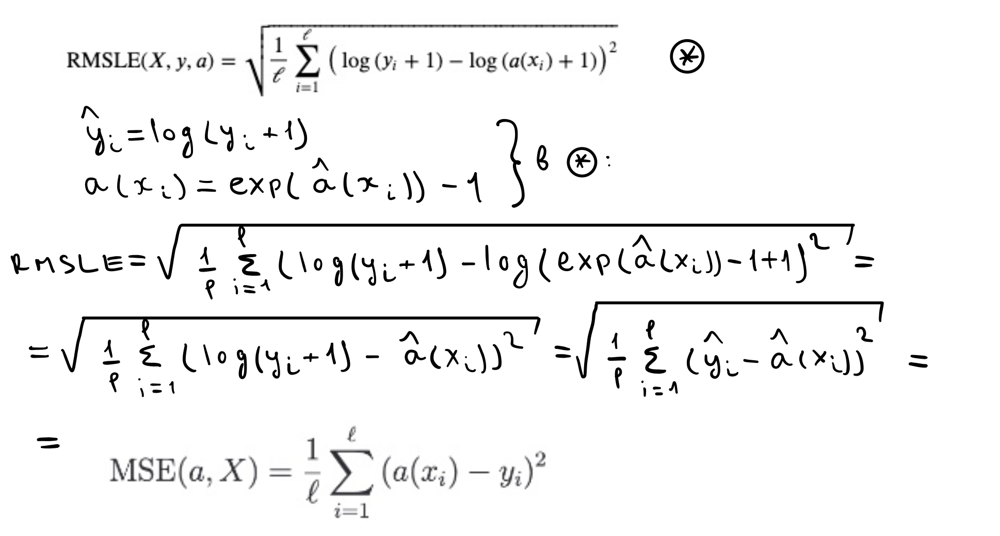

In [39]:
task_1['log_trip_duration'] = np.log1p(task_1['trip_duration'])
task_1 = task_1.drop(columns = ['trip_duration'])
task_1.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,6.122493
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,6.498282
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,7.661527
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,6.063785
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,6.077642


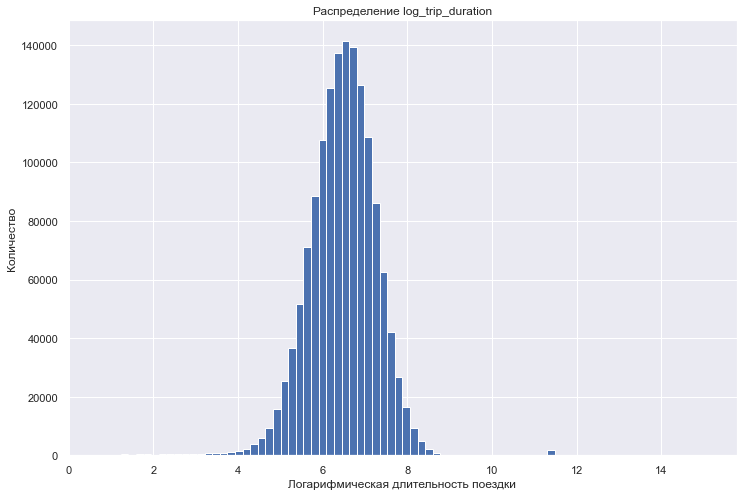

In [40]:
plt.figure(figsize=(12, 8))
plt.hist(task_1['log_trip_duration'], bins = 80)
plt.xlabel('Логарифмическая длительность поездки')
plt.ylabel('Количество')
plt.title('Распределение log_trip_duration')
plt.show()

Чтобы иметь некоторую точку отсчета, давайте посчитаем значение метрики при наилучшем константном предсказании:

In [41]:
def rmsle(log1p_y_true, log1p_y_pred): 
    return np.sqrt(np.mean((log1p_y_true - log1p_y_pred) ** 2))
    raise NotImplementedError

rmsle_best_const = rmsle(np.mean(task_1['log_trip_duration']), task_1['log_trip_duration'])
print(rmsle_best_const)
assert np.allclose(rmsle_best_const, 0.79575, 1e-4)

0.7957592365412156


## Часть 1. Изучаем `pickup_datetime` (2 балла)

**Задание 2 (0.25 баллов)**. Для начала давайте посмотрим, сколько всего было поездок в каждый из дней. Постройте график зависимости количества поездок от дня в году (например, можно воспользоваться `sns.countplot`):

#### График чисто для меня

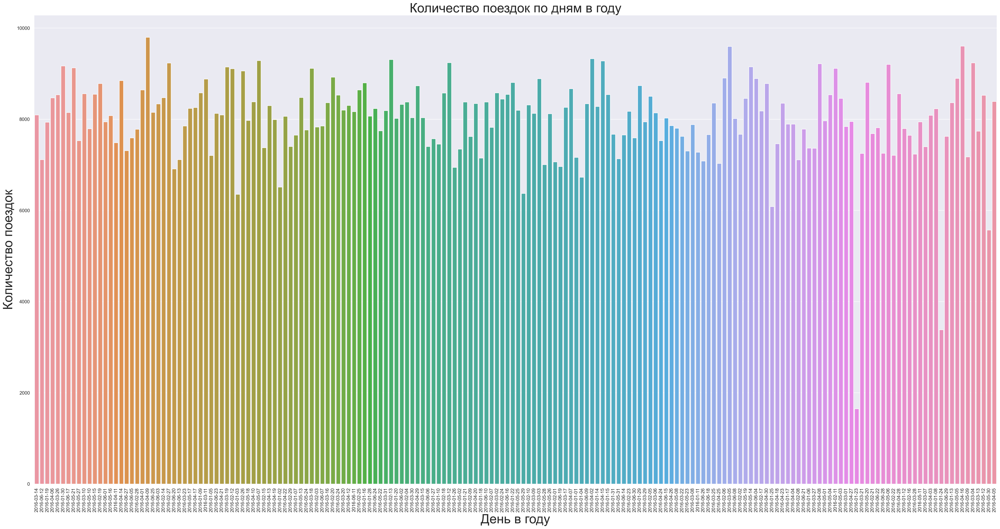

In [42]:
cnt_days = task_1['pickup_datetime'].dt.date.nunique()
plt.figure(figsize = (40, 20), dpi = 180)
sns.countplot(data = task_1, x = task_1['pickup_datetime'].dt.date)
plt.title('Количество поездок по дням в году', fontsize = 30)
plt.xlabel('День в году', fontsize = 30)
plt.ylabel('Количество поездок', fontsize = 30)
plt.xticks(rotation=90) 
plt.show()

Этот график с подписанной каждой датой, но он выглядит не очень (нужен он только мне, чтобы понять аномальные даты). Следующий график для эстетики

#### Смотреть на этот график

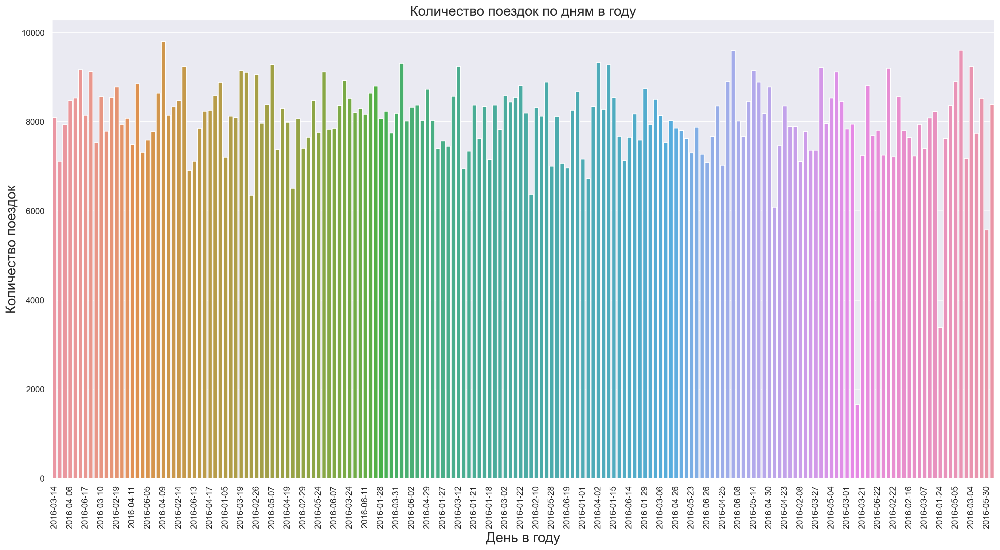

In [43]:
cnt_days = task_1['pickup_datetime'].dt.date.nunique()
plt.figure(figsize = (22, 11), dpi = 180)
sns.countplot(data = task_1, x = task_1['pickup_datetime'].dt.date)
plt.title('Количество поездок по дням в году', fontsize = 18)
plt.xlabel('День в году', fontsize = 18)
plt.ylabel('Количество поездок', fontsize = 18)
plt.xticks(range(0, cnt_days, 3), rotation=90) # подписал каждый 3-ий день
plt.show()

**Вопрос**: Вы, вероятно, заметили, что на графике есть 2 периода с аномально маленькими количествами поездок. Вычислите, в какие даты происходили эти скачки вниз и найдите информацию о том, что происходило в эти дни в Нью-Йорке.

Нарисуйте графики зависимости количества поездок от дня недели и от часов в сутках (воспользуйтесь `sns.relplot`):

#### Ответ на вопрос:
Первый аномальный период: (2016-01-23 - 2016-01-24) -  Власти запретили автомобильное движение в Нью-Йорке из-за снежной бури (продолжался до 2016-01-25)

Второй аномальный период: 2016-05-30 - День поминовения в Нью-Йорке. Этот день выходной в Нью-Йорке. Возможно много людей либо остались дома, либо поехали на выступление Обамы (да, я посмотрел новости и он там выступал), а поехали они на общественном транспорте/поши пешком, так как там было много народу и нельзя было подъехать на такси.

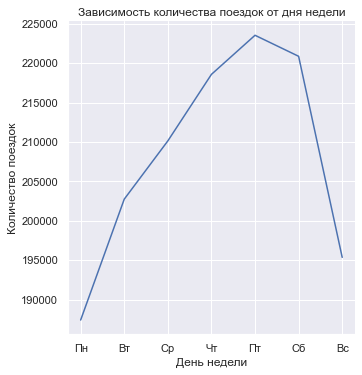

In [44]:
day_week = task_1.groupby(task_1['pickup_datetime'].dt.dayofweek).size().reset_index(name='cnt')

sns.relplot(data=day_week, x='pickup_datetime', y='cnt', kind ='line')
plt.title('Зависимость количества поездок от дня недели')
plt.xlabel('День недели')
plt.ylabel('Количество поездок')
plt.xticks(range(0, 7), labels=['Пн', 'Вт', 'Ср', 'Чт', 'Пт', 'Сб', 'Вс'])

plt.show()

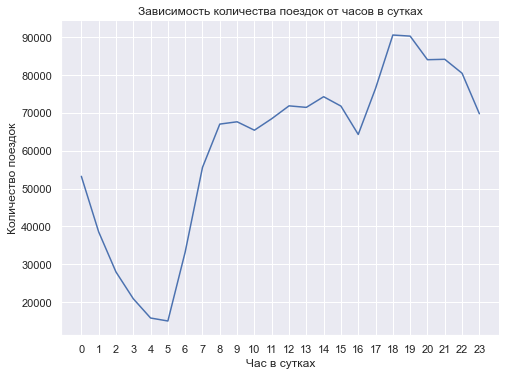

In [45]:
day_week = task_1.groupby(task_1['pickup_datetime'].dt.hour).size().reset_index(name='cnt')
sns.relplot(data=day_week, x='pickup_datetime', y='cnt', kind ='line', height = 5, aspect = 1.4)
plt.title('Зависимость количества поездок от часов в сутках')
plt.xlabel('Час в сутках')
plt.ylabel('Количество поездок')
plt.xticks(range(0, 24))
plt.show()

**Задание 3 (0.5 баллов)**. Нарисуйте на одном графике зависимости количества поездок от часа в сутках для разных месяцев (разные кривые, соответствующие разным месяцам, окрашивайте в разные цвета, воспользуйтесь `hue` в `sns.relplot`). Аналогично нарисуйте зависимости количества поездок от часа в сутках для разных дней недели.

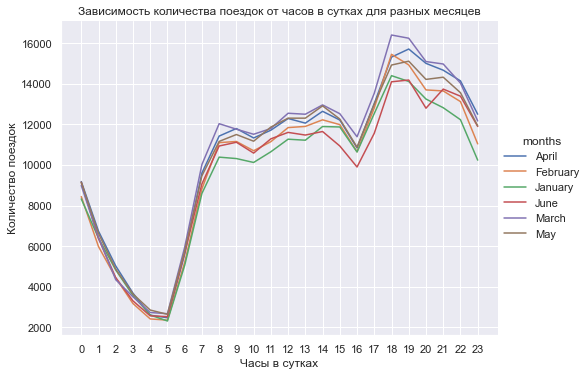

In [46]:
hour_months = task_1.groupby([task_1['pickup_datetime'].dt.hour.rename('hour'), task_1['pickup_datetime'].dt.month_name().rename('months')]).size().reset_index(name='cnt')

sns.relplot(data = hour_months, x = 'hour', y='cnt', hue = 'months', kind='line', height = 5, aspect = 1.4)
plt.title('Зависимость количества поездок от часов в сутках для разных месяцев')
plt.xlabel('Часы в сутках')
plt.ylabel('Количество поездок')
plt.xticks(range(0, 24))
plt.show()

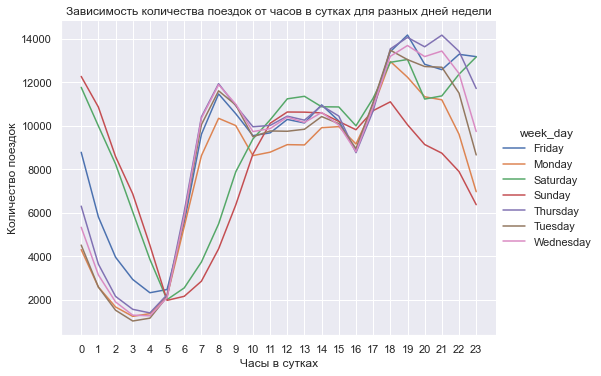

In [47]:
day_months = task_1.groupby([task_1['pickup_datetime'].dt.hour.rename('hour'), task_1['pickup_datetime'].dt.day_name().rename('week_day')]).size().reset_index(name='cnt')

sns.relplot(data = day_months, x = 'hour', y='cnt', hue = 'week_day', kind='line', height = 5, aspect = 1.4)
plt.title('Зависимость количества поездок от часов в сутках для разных дней недели')
plt.xlabel('Часы в сутках')
plt.ylabel('Количество поездок')
plt.xticks(range(0, 24))
plt.show()

**Вопрос**: Какие выводы можно сделать, основываясь на графиках выше? Выделяются ли какие-нибудь дни недели? Месяца? Время суток? С чем это связано?

**Задание 4 (0.5 баллов)**. Разбейте выборку на обучающую и тестовую в отношении 7:3 (используйте `train_test_split` из `sklearn`). По обучающей выборке нарисуйте график зависимости среднего логарифма времени поездки от дня недели. Затем сделайте то же самое, но для часа в сутках и дня в году.

#### Ответ на вопрос:
1) Наиболее популярны заказы с 18-21 часов для всех месяцев (ну это и логично, все с работы едут). Наименее популярны с 3-5 часов ночи (до 3-ех все уже вернулись домой, а после 5-и уже некоторые начинают ехать на работу)

2) В 16 часов есть скачок вниз, так как кто хотел уехать пораньше с работы уже уехал, а остальные работают дольше

3) Также есть скачок в 8 утра - это время, когда все как раз-таки едут на работу

4) В выходные часто заказывают такси в ночное время (эти дни преобладают над другими), многие отдыхают в барах/ресторанах и после едут домой на такси

5) В июне и январе меньше всего заказывают такси. Думаю в июне это происходит из-за лета (многие ходят пешком), а в январе из-за пробок, поэтому предпочитают общественный трнаспорт

In [48]:
from sklearn.model_selection import train_test_split

train_1, test_1 = train_test_split(task_1, test_size=0.3, random_state=10)


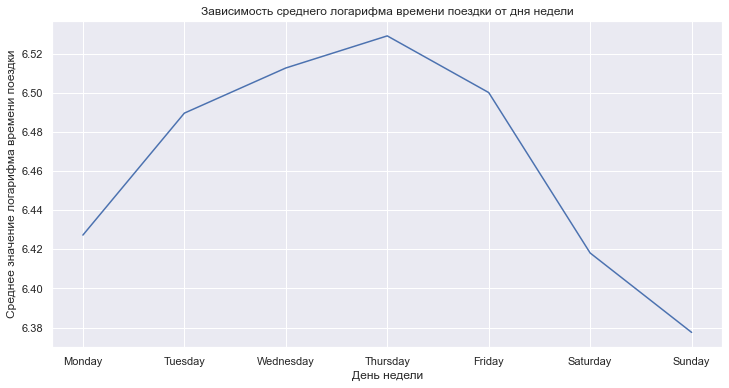

In [49]:
weekday_mean = train_1.groupby(train_1['pickup_datetime'].dt.day_name())['log_trip_duration'].mean()
mask = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_mean = weekday_mean.reindex(mask)

plt.figure(figsize=(12, 6))
plt.plot(weekday_mean.index, weekday_mean.values)
plt.title('Зависимость среднего логарифма времени поездки от дня недели')
plt.ylabel('Среднее значение логарифма времени поездки')
plt.xlabel('День недели')
plt.show()



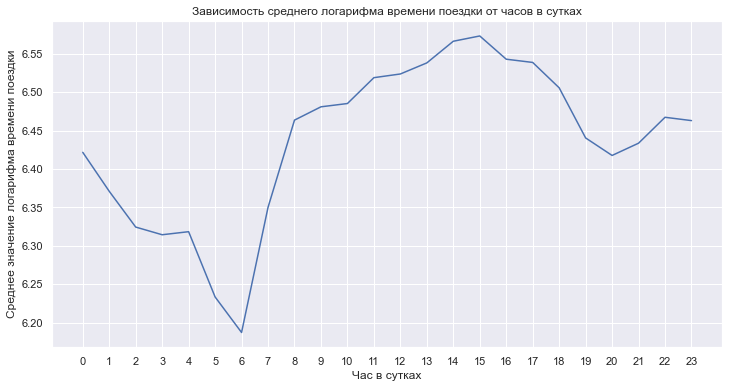

In [50]:
hour_mean = train_1.groupby(train_1['pickup_datetime'].dt.hour)['log_trip_duration'].mean()

plt.figure(figsize=(12, 6))
plt.plot(hour_mean.index, hour_mean.values)
plt.title('Зависимость среднего логарифма времени поездки от часов в сутках')
plt.ylabel('Среднее значение логарифма времени поездки')
plt.xlabel('Час в сутках')
plt.xticks(range(0, 24))

plt.show()

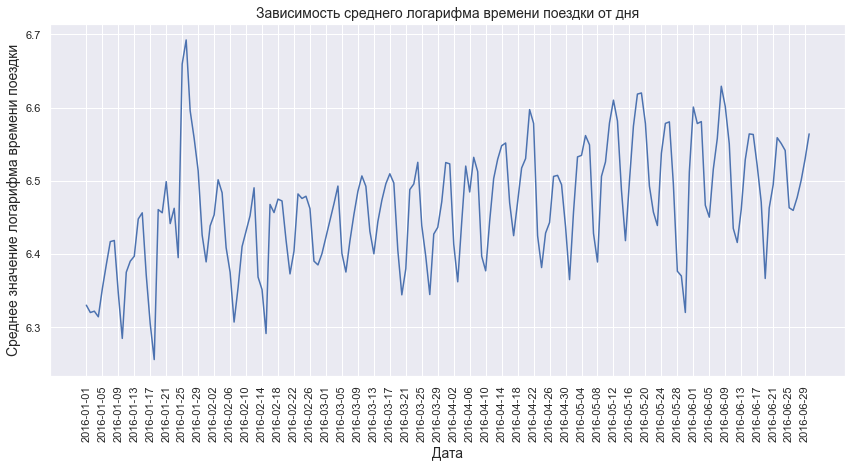

In [51]:
day_mean = train_1.groupby(train_1['pickup_datetime'].dt.date)['log_trip_duration'].mean()

plt.figure(figsize=(12, 6))
plt.plot(day_mean.index, day_mean.values)
plt.title('Зависимость среднего логарифма времени поездки от дня', fontsize = 14)
plt.ylabel('Среднее значение логарифма времени поездки', fontsize = 14)
plt.xlabel('Дата', fontsize = 14)
plt.tight_layout()
plt.xticks(day_mean.index[::4], labels=[i for i in day_mean.index][::4], rotation = 90)

plt.show()


**Вопрос**: Похожи ли графики зависимости таргета от дня недели и от часа в сутках на аналогичные графики для количества поездок? Почему? Что происходит со средним таргетом в те два аномальных периода, что мы видели выше? Почему так происходит? Наблюдаете ли вы какой-нибудь тренд на графике зависимости `log_trip_duration` от номера дня в году?

#### Ответы на вопросы:

1) Графики зависимости таргета от дня недели и от часа в сутках на аналогичные графики для количества поездок схожи тем, что максимум по середине. Думаю так происходит из-за того, что увеличивается рабочая активность и люди ездят по различным местам, связанные с работой. Они могут ездить между офисами, ездить на всякие конференции и т.д. Эта активность как раз-таки увеличивается в середине недели и в середине рабочего дня. Вечером, как и в пятницу (и в субботу с воскресеньем) время на поездки уменьшается, так как люди либо едут до ближайшего бара, либо до дома

2) В первый аномальный период (2016-01-23 - 2016-01-24) среднее время большое, это логично, так как из-за погоды увеличивалось время на поездку, также были перекрыты некоторые дороги (и те кто все-таки заказал такси провели много времени в пути). Во второй аномальный период (2016-05-30) среднее время просело, так как в этот день многие просто не заказывали такси, а кто заказывал далеко не ехал, так как это был крайний выходной перед рабочей неделей (дополнительный в пн)

3) Тренд наблюдается восходящий. Думаю это происходит из-за того, что начало графика - зима и люди заказывают такси даже на короткие дистанции (из-за холода). А ближе к лету короткие дистанции люди уже могут пройти и сами.

Добавьте следующие признаки на основе `pickup_datetime`:
1. День недели
2. Месяц
3. Час
4. Является ли период аномальным (два бинарных признака, соответствующие двум аномальным периодам)
5. Номер дня в году

In [52]:
train_1['weekday'] = train_1['pickup_datetime'].dt.dayofweek 
train_1['months'] = train_1['pickup_datetime'].dt.month 
train_1['hour'] = train_1['pickup_datetime'].dt.hour
train_1['anomaly'] = ((train_1['pickup_datetime'].dt.date == pd.to_datetime('2016-01-23').date()) | (train_1['pickup_datetime'].dt.date == pd.to_datetime('2016-01-24').date()) | (train_1['pickup_datetime'].dt.date == pd.to_datetime('2016-05-30').date())).astype(int)
train_1['number_day'] = train_1['pickup_datetime'].dt.dayofyear
train_1.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,weekday,months,hour,anomaly,number_day
824746,id2365163,2,2016-03-27 00:25:29,3,-73.996986,40.742210,-73.987740,40.710659,N,7.134891,6,3,0,0,87
645821,id3126187,2,2016-03-18 20:44:12,1,-73.989929,40.741760,-73.977280,40.783600,N,6.878326,4,3,20,0,78
691846,id2588127,2,2016-04-15 18:26:12,2,-73.972366,40.750725,-73.861832,40.768387,N,7.642524,4,4,18,0,106
1147931,id0915715,2,2016-03-24 14:28:34,1,-73.982361,40.776901,-73.975128,40.760921,N,6.888572,3,3,14,0,84
183569,id3758776,1,2016-04-28 13:53:52,1,-73.973778,40.764374,-73.966957,40.761024,N,6.177944,3,4,13,0,119


In [53]:
test_1['weekday'] = test_1['pickup_datetime'].dt.dayofweek 
test_1['months'] = test_1['pickup_datetime'].dt.month 
test_1['hour'] = test_1['pickup_datetime'].dt.hour 
test_1['anomaly'] = ((test_1['pickup_datetime'].dt.date == pd.to_datetime('2016-01-23').date()) | (test_1['pickup_datetime'].dt.date == pd.to_datetime('2016-01-24').date()) | (test_1['pickup_datetime'].dt.date == pd.to_datetime('2016-05-30').date())).astype(int)
test_1['number_day'] = test_1['pickup_datetime'].dt.dayofyear
test_1.head()


,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,weekday,months,hour,anomaly,number_day
112342,id2631171,2,2016-01-23 00:09:14,1,-74.006615,40.731712,-73.991890,40.727161,N,6.493754,5,1,0,1,23
840803,id2892416,1,2016-02-10 19:24:14,3,-73.963203,40.777924,-74.004059,40.747654,N,7.514255,2,2,19,0,41
184538,id3095142,2,2016-05-12 06:39:26,1,-73.987595,40.719822,-74.010994,40.716148,N,6.196444,3,5,6,0,133
512001,id3803823,2,2016-01-21 08:31:03,1,-73.969055,40.763618,-73.974129,40.778679,N,6.643790,3,1,8,0,21
776055,id3155730,2,2016-01-02 13:12:33,2,-73.950165,40.775635,-73.944534,40.779636,N,5.298317,5,1,13,0,2


Итак, мы уже создали некоторое количество признаков.

**Вопрос**: Какие из признаков _стоит рассматривать в этой задаче_   как категориальные, а какие - как численные? Почему?

Категориальные:

1) Аномалия - т.к. либо была, либо нет

2) Часы - просто сами часы не несут в себе численны показатель, но если мы бы разбили на утром/день/вечер и проверили бы анализ среди этих признаков, то можно было бы отнести их к численным

3) Номер дня - у нас нет прямой зависимости между днями, т. е. мы не можем по номеру предсказать будет ли у нас на следующий день длительность поездки больше/меньше (это просто категория - в какой день произошла поездка)

4) Месяц - время поездки можетт меняется из-за времени года (когда-то больше/меньше), но само число не влечет численный показатель

Численные:

1) День недели - исходя из графика времени поездок по дням есть рост от начала недели к середине и потом снижение. У нас некоторые дни коррелируют с друг другм (например: на выходных продолжительность поездки меньше). Т.е. есть некторая линейная зависимость между ними



**Задание 5 (0.75 баллов)**. Обучите `Ridge`-регрессию с параметрами по умолчанию, закодировав все категориальные признаки с помощью `OneHotEncoder`. Численные признаки отмасштабируйте с помощью `StandardScaler`. Используйте только признаки, которые мы выделили в этой части задания.

In [54]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Ridge

y_train = train_1["log_trip_duration"]
X_train = train_1.drop(columns=["log_trip_duration"])

y_test = test_1["log_trip_duration"]
X_test = test_1.drop(columns=["log_trip_duration"])


cat_features = ['months', 'number_day', 'anomaly', 'hour']
num_features = ['weekday']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), num_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])




In [55]:

model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)

tr_score = rmsle(y_pred, y_test)

tr_score


0.7864740185510192

## Часть 2. Изучаем координаты (3 балла)
Мы уже очень хорошо изучили данные о времени начала поездки, давайте теперь посмотрим на информацию о координатах начала и конца поездки. Мы подготовили для вас функцию, которая на карте рисует точки начала или конца поездки. Примеры ее вызова вы найдете ниже. Обратите внимание, что в эту функцию мы передаем лишь небольшой кусочек данных, посколько иначе функция будет работать очень долго

In [56]:
def show_circles_on_map(data, latitude_column, longitude_column, color):
    """
    The function draws map with circles on it.
    The center of the map is the mean of coordinates passed in data.
    
    data: DataFrame that contains columns latitude_column and longitude_column
    latitude_column: string, the name of column for latitude coordinates
    longitude_column: string, the name of column for longitude coordinates
    color: string, the color of circles to be drawn
    """

    location = (data[latitude_column].mean(), data[longitude_column].mean())
    m = folium.Map(location=location)

    for _, row in data.iterrows():
        folium.Circle(
            radius=100,
            location=(row[latitude_column], row[longitude_column]),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)

    return m

In [57]:
show_circles_on_map(train_1.sample(1000), "pickup_latitude", "pickup_longitude", "blue")

In [58]:
show_circles_on_map(train_1.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")

**Вопрос**: Какие пункты (или скопления точек, в количестве 2-3), по вашему мнению, выделяются на карте от основной массы и могут быть полезны для нашей задачи? Почему вы их выбрали? В чём особенность этих скоплений точек для нашей задачи?

Два аэропорта выделяются на фоне остальных. Они могут быть полезны, так как от них могут быть наиболее длительные поездки. Из аэропорта люди часто уезжают на такси домой и тут время поездки напрямую может зависеть от дня недели/времени года. Эти места обладают сезонностью - во время выходных/праздников продолжительность может сильно меняться

**Задание 6 (0.75 балл)**. Как мы все прекрасно помним, $t = s / v_{\text{ср}}$, поэтому очевидно, что самым сильным признаком будет расстояние, которое необходимо проехать. Мы не можем посчитать точное расстояние, которое необходимо преодолеть такси, но мы можем его оценить, посчитав кратчайшее расстояние между точками начала и конца поездки. Чтобы корректно посчитать расстояние между двумя точками на Земле, можно использовать функцию `haversine`. Также можно воспользоваться кодом с первого семинара. Посчитайте кратчайшее расстояние для объектов и запишите его в колонку `haversine`:

Взято с сема!

In [59]:
def haversine_array(lat1, lng1, lat2, lng2):
    lat1, lng1, lat2, lng2 = map(np.radians, (lat1, lng1, lat2, lng2))
    AVG_EARTH_RADIUS = 6371  # in km
    lat = lat2 - lat1
    lng = lng2 - lng1
    d = np.sin(lat * 0.5) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(lng * 0.5) ** 2
    h = 2 * AVG_EARTH_RADIUS * np.arcsin(np.sqrt(d))
    return h

In [60]:
train_1.loc[:, 'haversine'] = haversine_array(train_1['pickup_latitude'].values, train_1['pickup_longitude'].values, train_1['dropoff_latitude'].values, train_1['dropoff_longitude'].values)
test_1.loc[:, 'haversine'] = haversine_array(test_1['pickup_latitude'].values, test_1['pickup_longitude'].values, test_1['dropoff_latitude'].values, test_1['dropoff_longitude'].values)


Так как мы предсказываем логарифм времени поездки и хотим, чтобы наши признаки были линейно зависимы с этой целевой переменной, нам нужно логарифмировать расстояние: $\log t = \log s - \log{v_{\text{ср}}}$. Запишите логарифм `haversine` в отдельную колонку `log_haversine`:

In [61]:
train_1['log_haversine'] = np.log1p(train_1['haversine'])
test_1['log_haversine'] = np.log1p(test_1['haversine'])


Убедимся, что логарифм расстояния лучше коррелирует с нашим таргетом, чем просто расстояние:

In [62]:
your_df = train_1 
assert your_df['log_haversine'].corr(your_df['log_trip_duration']) > your_df['haversine'].corr(your_df['log_trip_duration'])

Сохраню-ка я лучше эту таблицу, пока 1000 раз не перетер) 

In [63]:
my = train_1.copy()

**Задание 7 (0.75 балла)**. Давайте изучим среднюю скорость движения такси. Посчитайте среднюю скорость для каждого объекта обучающей выборки, разделив `haversine` на `trip_duration`, и нарисуйте гистограмму ее распределения

In [64]:
my['av_speed'] = (my['haversine'] * 3600) / np.expm1(my['log_trip_duration'])

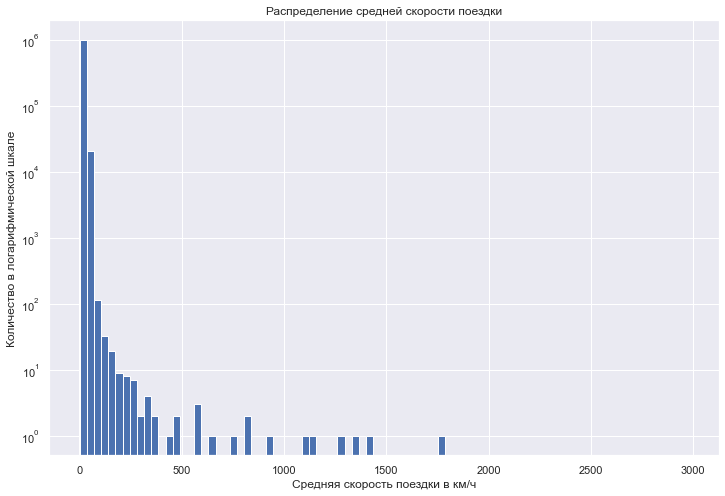

In [65]:
plt.figure(figsize=(12, 8))
plt.hist(my['av_speed'], bins = np.arange(1,3000,35), log = True)
plt.xlabel('Средняя скорость поездки в км/ч')
plt.ylabel('Количество в логарифмической шкале')
plt.title('Распределение средней скорости поездки')
plt.show()

Как можно видеть по гистограмме, для некоторых объектов у нас получились очень больше значения скоростей. Нарисуйте гистограмму по объектам, для которых значение скорости получилось разумным (например, можно не включать рассмотрение объекты, где скорость больше некоторой квантили):

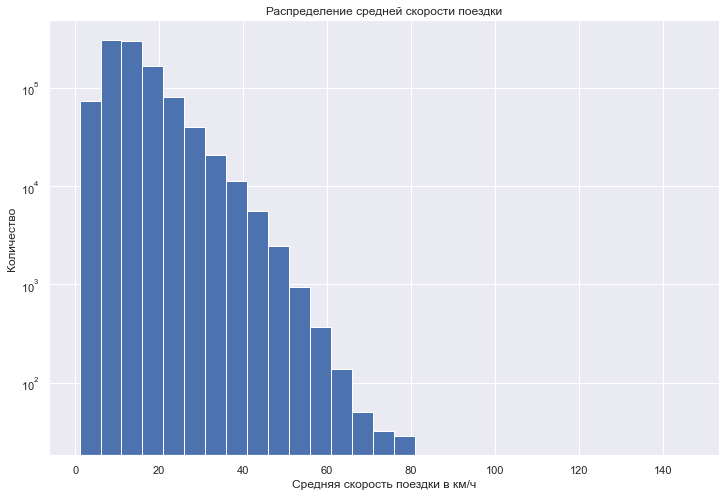

In [66]:
my = my[my["av_speed"] <= 80]
plt.figure(figsize=(12, 8))
plt.hist(my['av_speed'], bins = np.arange(1,150,5), log = True)
plt.xlabel('Средняя скорость поездки в км/ч')
plt.ylabel('Количество')
plt.title('Распределение средней скорости поездки')
plt.show()

Для каждой пары (день недели, час суток) посчитайте медиану скоростей. Нарисуйте с помощью `sns.heatmap` график, где по осям будут дни недели и часы, а в качестве значения функции - медиана скорости

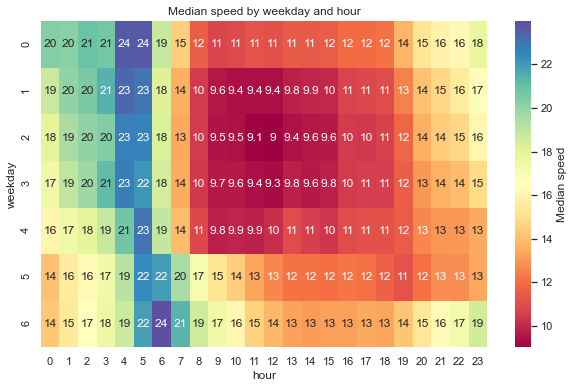

In [67]:
median_speeds = my.groupby(['weekday', 'hour'])['av_speed'].median().unstack()
plt.figure(figsize=(10, 6))
sns.heatmap(median_speeds, annot=True, cmap="Spectral", cbar_kws={'label': 'Median speed'})
plt.title('Median speed by weekday and hour')
plt.show()

Не забудьте удалить колонку со значением скорости из данных!

**Вопрос**: Почему значение скорости нельзя использовать во время обучения?

Так как скорость зависит от самой целевой переменной, которую мы хотим предсказать)

**Вопрос**: Посмотрите внимательно на график и скажите, в какие моменты времени скорость минимальна; максимальна.

Создайте признаки "поездка совершается в период пробок" и "поездка совершается в период свободных дорог" (естественно, они не должен зависеть от скорости!):

Скорость минимальная в середине недели в обед. А максимальная ночью (особенно в первые дни недели)

In [68]:
# сначала маска для пробок, я буду брать значение скорости <= 12 км/ч
full_tr = (train_1['weekday'] <= 4) & (train_1['hour'] >= 8) & (train_1['hour'] <= 18) | (train_1['weekday'] == 5) & (train_1['hour'] >= 13) & (train_1['hour'] <= 20) | (train_1['weekday'] >= 2) & (train_1['weekday'] <= 4) & (train_1['hour'] == 19)

# маска для свободных дорог, я буду брать значение скорости >= 20 км/ч

no_tr = (train_1['weekday'] >= 5) & (train_1['weekday'] <= 6) & (train_1['hour'] >= 5) & (train_1['hour'] <= 7) | (train_1['weekday'] <= 4) & (train_1['hour'] >= 4) & (train_1['hour'] <= 5) | (train_1['weekday'] <= 3) & (train_1['hour'] >= 2) & (train_1['hour'] <= 3) | (train_1['weekday'] == 0) & (train_1['hour'] <= 1) | (train_1['weekday'] == 1) & (train_1['hour'] <= 1)                                       

train_1['full_traffic'] = full_tr.astype(int)
train_1['empty_traffic'] = no_tr.astype(int)

full_tr_test = (test_1['weekday'] <= 4) & (test_1['hour'] >= 8) & (test_1['hour'] <= 18) | (test_1['weekday'] == 5) & (test_1['hour'] >= 13) & (test_1['hour'] <= 20) | (test_1['weekday'] >= 2) & (test_1['weekday'] <= 4) & (test_1['hour'] == 19)
no_tr_test = (test_1['weekday'] >= 5) & (test_1['weekday'] <= 6) & (test_1['hour'] >= 5) & (test_1['hour'] <= 7) | (test_1['weekday'] <= 4) & (test_1['hour'] >= 4) & (test_1['hour'] <= 5) | (train_1['weekday'] <= 3) & (test_1['hour'] >= 2) & (test_1['hour'] <= 3) | (test_1['weekday'] == 0) & (test_1['hour'] <= 1) | (test_1['weekday'] == 1) & (test_1['hour'] <= 1)   

test_1['full_traffic'] = full_tr_test.astype(int)
test_1['empty_traffic'] = no_tr_test.astype(int)

train_1.head()



,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,weekday,months,hour,anomaly,number_day,haversine,log_haversine,full_traffic,empty_traffic
824746,id2365163,2,2016-03-27 00:25:29,3,-73.996986,40.742210,-73.987740,40.710659,N,7.134891,6,3,0,0,87,3.593840,1.524716,0,0
645821,id3126187,2,2016-03-18 20:44:12,1,-73.989929,40.741760,-73.977280,40.783600,N,6.878326,4,3,20,0,78,4.772773,1.753153,0,0
691846,id2588127,2,2016-04-15 18:26:12,2,-73.972366,40.750725,-73.861832,40.768387,N,7.642524,4,4,18,0,106,9.514706,2.352775,1,0
1147931,id0915715,2,2016-03-24 14:28:34,1,-73.982361,40.776901,-73.975128,40.760921,N,6.888572,3,3,14,0,84,1.878364,1.057222,1,0
183569,id3758776,1,2016-04-28 13:53:52,1,-73.973778,40.764374,-73.966957,40.761024,N,6.177944,3,4,13,0,119,0.684609,0.521533,1,0


**Задание 8 (0.25 балла)**. Для каждого из замеченных вами выше 2-3 пунктов добавьте в выборку по два признака: 
- началась ли поездка в этом пункте
- закончилась ли поездка в этом пункте

Как вы думаете, почему эти признаки могут быть полезны?

Сначала сделаю 4 координаты для каждого аэрропорта (Ла-Гвардия и Кеннеди).

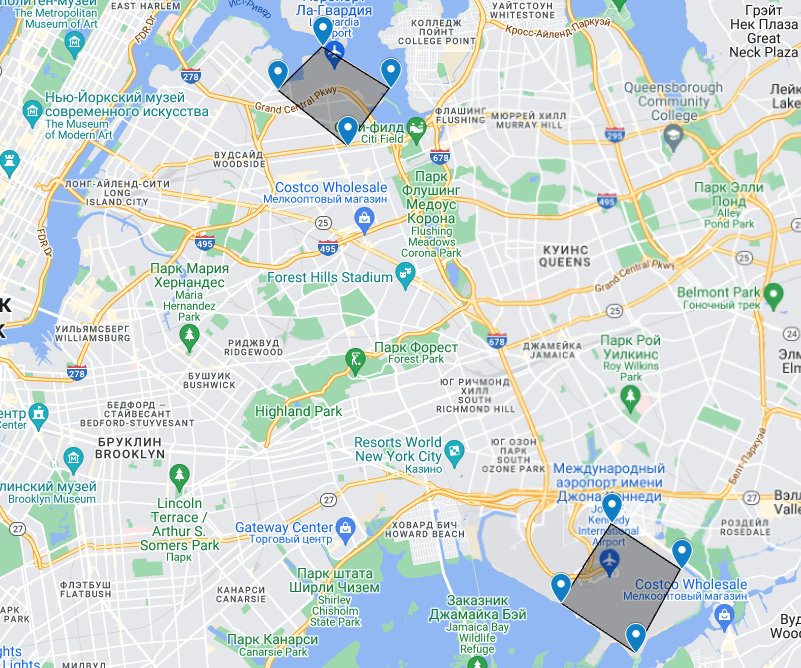

In [69]:
# сделаю метод трассировки лучей (проводим прямую от точки, если пересечений нечетное, то внутри, иначае снаружи)

def in_zone(latitudes, longitudes, zone):
    
    ans = np.zeros(len(latitudes), dtype=int)
    
    for i in range(len(zone)):
        if i != len(zone) - 1:
            
            x_i, y_i = zone[i]
            x_j, y_j = zone[i + 1]
        
        else:
            x_i, y_i = zone[i]
            x_j, y_j = zone[0]
            
            
        possible_points = ((y_i < longitudes) & (y_j >= longitudes)) | ((y_j < longitudes) & (y_i >= longitudes))
        
        cross_x = x_i + (longitudes - y_i) / (y_j - y_i) * (x_j - x_i)
        possible_points = possible_points & (cross_x < latitudes)
        
        ans[possible_points] = 1
        
    
    return ans


la_gvardiya = [(40.78298, -73.8784), (40.77142, -73.8936), (40.75685, -73.86982), (40.77194, -73.85489)]
kennedy = [(40.65873, -73.77915), (40.63789, -73.79666), (40.62486, -73.77074), (40.64675, -73.75495)]


train_1['start_in'] = in_zone(train_1['pickup_latitude'].values, train_1['pickup_longitude'].values, la_gvardiya) | in_zone(train_1['pickup_latitude'].values, train_1['pickup_longitude'].values, kennedy).astype(int)

train_1['finish_in'] = in_zone(train_1['dropoff_latitude'].values, train_1['dropoff_longitude'].values, la_gvardiya) | in_zone(train_1['dropoff_latitude'].values, train_1['dropoff_longitude'].values, kennedy).astype(int)






In [70]:
train_1.sort_values('start_in', ascending = False).head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,...,months,hour,anomaly,number_day,haversine,log_haversine,full_traffic,empty_traffic,start_in,finish_in
643971,id1957386,1,2016-02-19 06:26:00,1,-73.783562,40.648464,-74.015175,40.675980,N,7.894691,...,2,6,0,50,19.774342,3.033719,0,0,1,0
1261011,id0370324,2,2016-03-20 20:34:11,1,-73.874969,40.773960,-73.976753,40.751968,N,6.833032,...,3,20,0,80,8.914290,2.293977,0,0,1,0
106929,id2443616,1,2016-05-05 15:06:52,1,-73.782310,40.644619,-73.896935,40.730827,N,7.949797,...,5,15,0,126,13.612338,2.681866,1,0,1,0
136263,id0118522,1,2016-02-23 15:48:33,1,-73.783722,40.648674,-73.975372,40.761375,N,8.342125,...,2,15,0,54,20.445822,3.065530,1,0,1,0
153779,id0395102,1,2016-05-16 16:48:56,1,-73.863640,40.769718,-73.994698,40.743988,N,7.748891,...,5,16,0,137,11.403563,2.517984,1,0,1,0


In [71]:
test_1['start_in'] = in_zone(test_1['pickup_latitude'].values, test_1['pickup_longitude'].values, la_gvardiya) | in_zone(test_1['pickup_latitude'].values, test_1['pickup_longitude'].values, kennedy).astype(int)

test_1['finish_in'] = in_zone(test_1['dropoff_latitude'].values, test_1['dropoff_longitude'].values, la_gvardiya) | in_zone(test_1['dropoff_latitude'].values, test_1['dropoff_longitude'].values, kennedy).astype(int)



Для каждого из созданных признаков нарисуйте "ящик с усами" (`sns.boxplot`) распределения логарифма времени поездки

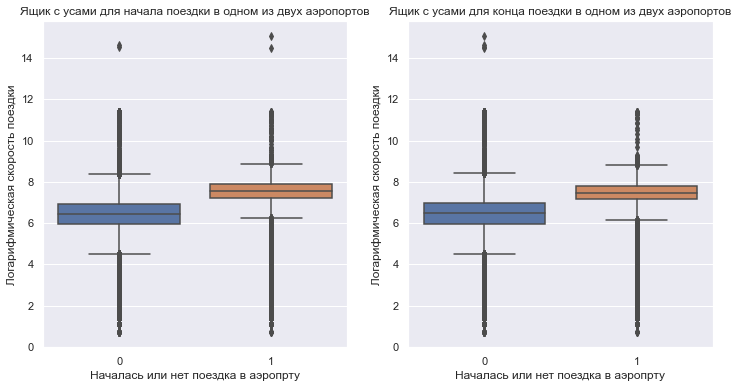

In [72]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x=train_1['start_in'], y=train_1['log_trip_duration'])
plt.title('Ящик с усами для начала поездки в одном из двух аэропортов')
plt.xlabel('Началась или нет поездка в аэропрту')
plt.ylabel('Логарифмическая скорость поездки')

plt.subplot(1, 2, 2)
sns.boxplot(x=train_1['finish_in'], y=train_1['log_trip_duration'])
plt.title('Ящик с усами для конца поездки в одном из двух аэропортов')
plt.xlabel('Началась или нет поездка в аэропрту')
plt.ylabel('Логарифмическая скорость поездки')
plt.show()

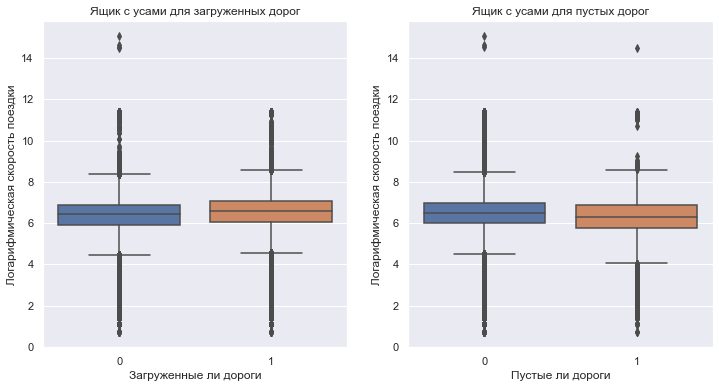

In [73]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x=train_1['full_traffic'], y=train_1['log_trip_duration'])
plt.title('Ящик с усами для загруженных дорог')
plt.xlabel('Загруженные ли дороги')
plt.ylabel('Логарифмическая скорость поездки')

plt.subplot(1, 2, 2)
sns.boxplot(x=train_1['empty_traffic'], y=train_1['log_trip_duration'])
plt.title('Ящик с усами для пустых дорог')
plt.xlabel('Пустые ли дороги')
plt.ylabel('Логарифмическая скорость поездки')
plt.show()

**Вопрос**: судя по графикам, как вы думаете, хорошими ли получились эти признаки?

1) Признак с аэропортам думаю хороший, так как среднее время больше, чем поездки вне аэропортов. Также разброс данных несильно большой, а это значит что можно легче предсказывать время поездки.

2) Признак с загруженностью/пустотой дорог не очень хорош, так значения не сильно отличаются

<img src="https://www.dropbox.com/s/xson9nukz5hba7c/map.png?raw=1" align="right" width="20%" style="margin-left: 20px; margin-bottom: 20px">

**Задание 9 (1 балл)**. Сейчас мы почти что не используем сами значения координат. На это есть несколько причин: по отдельности рассматривать широту и долготу не имеет особого смысла, стоит рассматривать их вместе. Во-вторых, понятно, что зависимость между нашим таргетом и координатами не линейная. Чтобы как-то использовать координаты, можно прибегнуть к следующему трюку: обрамим область с наибольшим количеством поездок прямоугольником (как на рисунке). Разобьем этот прямоугольник на ячейки. Каждой точке сопоставим номер ее ячейки, а тем точкам, что не попали ни в одну из ячеек, сопоставим значение -1.

Напишите трансформер, который сначала разбивает показанную на рисунке область на ячейки, а затем создает два признака: номер ячейки, в которой началась поездка, и номер ячейки, в которой закончилась поездка. Количество строк и столбцов выберите самостоятельно.

Обратите внимание, что все вычисления должны быть векторизованными, трансформер не должен модифицировать передаваемую ему выборку inplace, а все необходимые статистики (если они вдруг нужны) нужно считать только по обучающей выборке в методе `fit`:

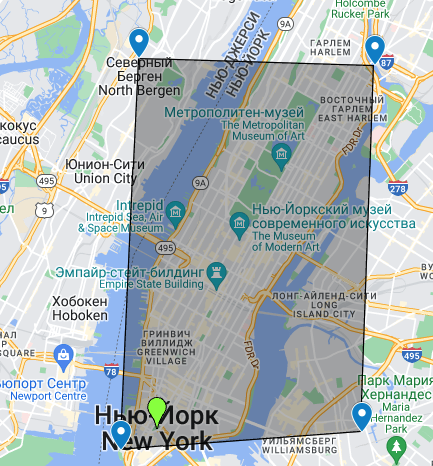

In [74]:
from sklearn.base import BaseEstimator, TransformerMixin


# TransformerMixin implements fit_transform for you,
# applying your fit and transform consistently

class MapGridTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, long_min, long_max, lat_min, lat_max, rows = 100, cols = 100):
        self.rows = rows
        self.cols = cols
        self.long_min = long_min
        self.long_max = long_max
        self.lat_min = lat_min
        self.lat_max = lat_max
        self.long_bins = np.linspace(long_min, long_max, self.cols + 1)
        self.lat_bins = np.linspace(lat_min, lat_max, self.rows + 1)
        self.coord = []
        pass
    
    def show_map(self, X):
        X = X[(X['start_zone'] != -1) & (X['finish_zone'] != -1)]
        location = (X['pickup_latitude'].mean(), X['pickup_longitude'].mean())  
        m = folium.Map(location=location)
        for i in range(len(self.lat_bins)-1):
            for j in range(len(self.long_bins)-1):
                self.coord = [
                    (self.lat_bins[i], self.long_bins[j]),  
                    (self.lat_bins[i+1], self.long_bins[j]),  
                    (self.lat_bins[i+1], self.long_bins[j+1]),  
                    (self.lat_bins[i], self.long_bins[j+1]),  
                    (self.lat_bins[i], self.long_bins[j])  
                ]
                folium.PolyLine(self.coord, color="blue", weight=2.5).add_to(m)
        
        for _, row in X.iterrows():
            folium.CircleMarker(
                location=(row['pickup_latitude'], row['pickup_longitude']),
                radius=5,
                color='red',
                fill=True,
                fill_color='blue'
            ).add_to(m)

        return m
    #сделаю гистограмму с распределением внутри моего разбиения
    def hist_map(self, long, lat):
        plt.hist2d(long, lat, bins=(self.long_bins, self.lat_bins), cmap='OrRd')
        plt.colorbar(label='Количество')
        plt.xlabel('Долгота')
        plt.ylabel('Широта')
        plt.show()
       
    
    def fit(self, X=None, y=None):
        # your code here
        return self

    def transform(self, X, y=None):
        
        X_new = X.copy()
        start_long = np.digitize(X['pickup_longitude'], self.long_bins) - 1
        start_lat = np.digitize(X['pickup_latitude'], self.lat_bins) - 1
        
        X_new['start_zone'] = start_lat * self.cols + start_long + 1

        end_long = np.digitize(X['dropoff_longitude'], self.long_bins) - 1
        end_lat = np.digitize(X['dropoff_latitude'], self.lat_bins) - 1
        
        X_new['finish_zone'] = end_lat * self.cols + end_long + 1
        
        X_new.loc[(start_long < 0) | (start_long >= self.cols) | 
                           (start_lat < 0) | (start_lat >= self.rows), 'start_zone'] = -1

        X_new.loc[(end_long < 0) | (end_long >= self.cols) | 
                           (end_lat < 0) | (end_lat >= self.rows), 'finish_zone'] = -1

        return X_new

In [75]:
trans = MapGridTransformer(long_min=-74.01874, long_max=-73.93153, lat_min=40.70704, lat_max=40.80716)
train_1 = trans.transform(train_1)
test_1 = trans.transform(test_1)


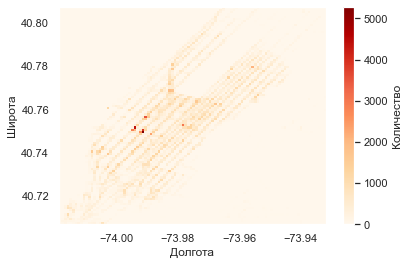

In [76]:
trans.hist_map(train_1['pickup_longitude'], train_1['pickup_latitude'])

In [77]:
trans.show_map(train_1.sample(300))

**Задание 10 (0.25 балла)**. Обучите `Ridge`-регрессию со стандартными параметрами на признаках, которые мы выделили к текущему моменту. Категориальные признаки закодируйте через one-hot-кодирование, числовые признаки отмасштабируйте.

In [78]:

y_train = train_1["log_trip_duration"]
X_train = train_1.drop(columns=["log_trip_duration"])

y_test = test_1["log_trip_duration"]
X_test = test_1.drop(columns=["log_trip_duration"])


cat_features = ['months', 'number_day', 'anomaly', 'hour', 'empty_traffic', 'full_traffic', 'start_in', 'finish_in', 'start_zone', 'finish_zone']
num_features = ['weekday', 'log_haversine']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), num_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])




In [79]:
model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)

tr_score = rmsle(y_pred, y_test)

tr_score

0.46309789872617607

## Часть 3. Изучаем оставшиеся признаки (1 балл)

**Задание 11 (0.75 баллов)**. У нас осталось еще 3 признака, которые мы не исследовали: `vendor_id`, `passenger_count` и `store_and_fwd_flag`.

**Вопрос**: Подумайте, почему каждый из этих признаков может быть потенциально полезным.
### Ответ:

1) vendor_id может быть полезен тем, что у некоторых провайдеров могут быть неправильные данные о поездке. Поэтому можно их классифицировать 

2) passenger_count может быть полезен тем, что на длинные поездки разумнее ехать вместе (чтобы вышло дешевле)

3) store_and_fwd_flag может помочь неправильными данными, переданными от провайдера (или тем, не является ли наша поездка выбросом)

Посчитайте, сколько есть уникальных значений у каждого из этих признаков:

In [80]:
ven_un = train_1['vendor_id'].value_counts()
pas_cnt = train_1['passenger_count'].value_counts()
fl_cnt = train_1['store_and_fwd_flag'].value_counts()

print('vendor_id:')
print(ven_un)


vendor_id:
2    545698
1    475352
Name: vendor_id, dtype: int64


In [81]:
print('passenger_count:')
print(pas_cnt)

passenger_count:
1    723660
2    147209
5     54672
3     41808
6     33814
4     19848
0        37
7         1
8         1
Name: passenger_count, dtype: int64


In [82]:
print('store_and_fwd_flag:')
print(fl_cnt)

store_and_fwd_flag:
N    1015395
Y       5655
Name: store_and_fwd_flag, dtype: int64


Постройте "ящики с усами" распределений логарифма времени поездки в зависимости от значений каждого из признаков

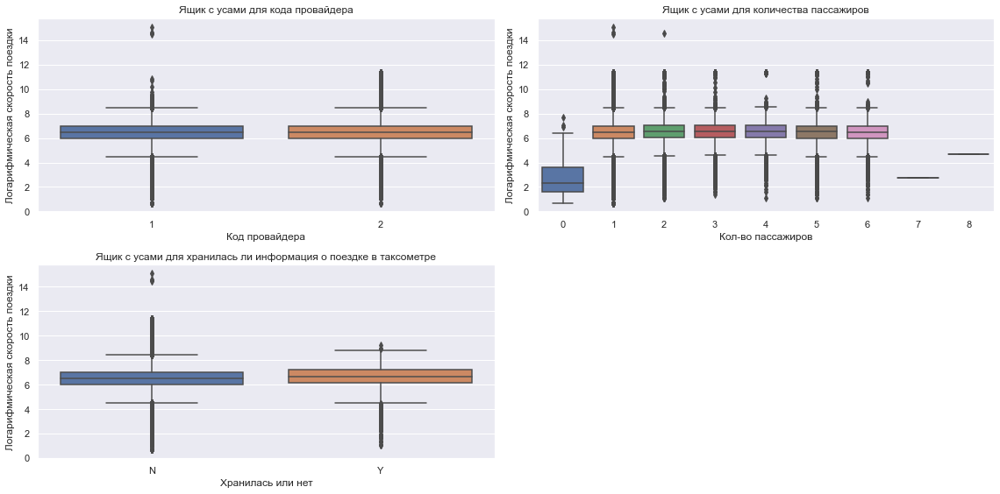

In [83]:
plt.figure(figsize=(16, 8))

plt.subplot(2, 2, 1)
sns.boxplot(x=train_1['vendor_id'], y=train_1['log_trip_duration'])
plt.title('Ящик с усами для кода провайдера')
plt.xlabel('Код провайдера')
plt.ylabel('Логарифмическая скорость поездки')

plt.subplot(2, 2, 2)
sns.boxplot(x=train_1['passenger_count'], y=train_1['log_trip_duration'])
plt.title('Ящик с усами для количества пассажиров')
plt.xlabel('Кол-во пассажиров')
plt.ylabel('Логарифмическая скорость поездки')

plt.subplot(2, 2, 3)
sns.boxplot(x=train_1['store_and_fwd_flag'], y=train_1['log_trip_duration'])
plt.title('Ящик с усами для хранилась ли информация о поездке в таксометре')
plt.xlabel('Хранилась или нет')
plt.ylabel('Логарифмическая скорость поездки')

plt.tight_layout()
plt.show()

Переведите признаки `vendor_id` и `store_and_fwd_flag` в значения $\{0;1\}$

In [84]:
train_1['vendor_id'] = train_1['vendor_id'].replace({1: 0, 2: 1})
train_1['store_and_fwd_flag'] = train_1['store_and_fwd_flag'].replace({'N': 0, 'Y': 1})

test_1['vendor_id'] = test_1['vendor_id'].replace({1: 0, 2: 1})
test_1['store_and_fwd_flag'] = test_1['store_and_fwd_flag'].replace({'N': 0, 'Y': 1})

train_1.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,...,anomaly,number_day,haversine,log_haversine,full_traffic,empty_traffic,start_in,finish_in,start_zone,finish_zone
824746,id2365163,1,2016-03-27 00:25:29,3,-73.996986,40.742210,-73.987740,40.710659,0,7.134891,...,0,87,3.593840,1.524716,0,0,0,0,3525,336
645821,id3126187,1,2016-03-18 20:44:12,1,-73.989929,40.741760,-73.977280,40.783600,0,6.878326,...,0,78,4.772773,1.753153,0,0,0,0,3434,7648
691846,id2588127,1,2016-04-15 18:26:12,2,-73.972366,40.750725,-73.861832,40.768387,0,7.642524,...,0,106,9.514706,2.352775,1,0,0,1,4354,-1
1147931,id0915715,1,2016-03-24 14:28:34,1,-73.982361,40.776901,-73.975128,40.760921,0,6.888572,...,0,84,1.878364,1.057222,1,0,0,0,6942,5351
183569,id3758776,0,2016-04-28 13:53:52,1,-73.973778,40.764374,-73.966957,40.761024,0,6.177944,...,0,119,0.684609,0.521533,1,0,0,0,5752,5360


**Вопрос**: Основываясь на графиках выше, как вы думаете, будут ли эти признаки сильными?

Думаю нет, так как сильных различий между значениями в признаках нет. Но на количестве пассажиров есть выброс (0 пассажиров), это точно должно помочь

**Задание 12 (0.25 баллов)**. Проверьте свои предположения, обучив модель в том числе и на этих трех признаках. Обучайте `Ridge`-регрессию со стандартными параметрами. Категориальные признаки закодируйте one-hot-кодированием, а численные отмасштабируйте.

In [85]:
y_train = train_1["log_trip_duration"]
X_train = train_1.drop(columns=["log_trip_duration"])

y_test = test_1["log_trip_duration"]
X_test = test_1.drop(columns=["log_trip_duration"])


cat_features = ['months', 'number_day', 'anomaly', 'hour', 'empty_traffic', 'full_traffic', 'start_in', 'finish_in', 'start_zone', 'finish_zone', 'vendor_id', 'passenger_count', 'store_and_fwd_flag']
num_features = ['weekday', 'log_haversine']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), num_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])


In [86]:
model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)

tr_score = rmsle(y_pred, y_test)

tr_score

0.4628686062206139

Если признаки не дали какого-то ощутимого улучшения метрики, их можно выбросить из данных.

окей, босс

In [87]:
train_1 = train_1.drop(columns=['vendor_id', 'passenger_count', 'store_and_fwd_flag'])
test_1 = test_1.drop(columns=['vendor_id', 'passenger_count', 'store_and_fwd_flag'])
test_1.head()

,id,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,log_trip_duration,weekday,months,hour,anomaly,number_day,haversine,log_haversine,full_traffic,empty_traffic,start_in,finish_in,start_zone,finish_zone
112342,id2631171,2016-01-23 00:09:14,-74.006615,40.731712,-73.991890,40.727161,6.493754,5,1,0,1,23,1.339983,0.850144,0,0,0,0,2414,2031
840803,id2892416,2016-02-10 19:24:14,-73.963203,40.777924,-74.004059,40.747654,7.514255,2,2,19,0,41,4.813370,1.760160,1,0,0,0,7064,4017
184538,id3095142,2016-05-12 06:39:26,-73.987595,40.719822,-74.010994,40.716148,6.196444,3,5,6,0,133,2.013910,1.103238,0,0,0,0,1236,909
512001,id3803823,2016-01-21 08:31:03,-73.969055,40.763618,-73.974129,40.778679,6.643790,3,1,8,0,21,1.728285,1.003673,1,0,0,0,5657,7152
776055,id3155730,2016-01-02 13:12:33,-73.950165,40.775635,-73.944534,40.779636,5.298317,5,1,13,0,2,0.650200,0.500897,1,0,0,0,6879,7286


## Часть 4. Улучшаем модель (3 балла)

**Задание 13 (1 балл)**. В наших данных есть нетипичные объекты (выбросы, или outliers): с аномально маленьким времени поездки, с очень большим пройденным расстоянием или очень большими остатками регрессии. В этом задании предлагается исключить такие объекты из обучающей выборки. Для этого нарисуйте гистограммы распределения упомянутых выше величин, выберите объекты, которые можно назвать выбросами, и очистите __обучающую выборку__ от них.

Отметим, что хотя эти объекты и выглядят как выбросы, в тестовой выборке тоже скорее всего будут объекты с такими же странными значениями целевой переменной и/или признаков. Поэтому, возможно, чистка обучающей выборки приведёт к ухудшению качества на тесте. Тем не менее, всё равно лучше удалять выбросы из обучения, чтобы модель получалась более разумной и интерпретируемой.

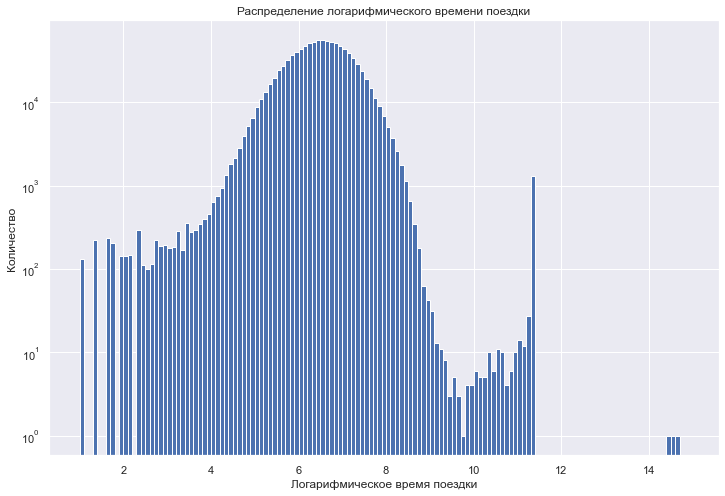

In [88]:
plt.figure(figsize=(12, 8))
plt.hist(train_1['log_trip_duration'], bins = np.arange(1,15,0.1), log = True)
plt.xlabel('Логарифмическое время поездки')
plt.ylabel('Количество')
plt.title('Распределение логарифмического времени поездки')
plt.show()

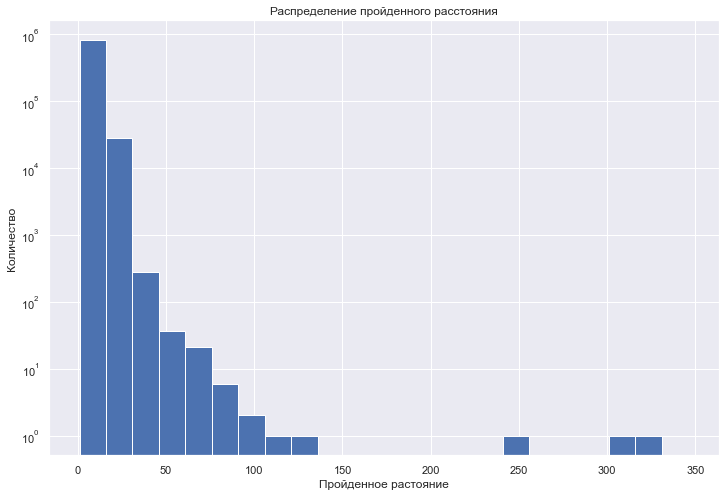

In [89]:
plt.figure(figsize=(12, 8))
plt.hist(train_1['haversine'], bins = np.arange(1,350, 15), log = True)
plt.xlabel('Пройденное растояние')
plt.ylabel('Количество')
plt.title('Распределение пройденного расстояния')
plt.show()

In [90]:
y_pred = model.predict(X_train)
residuals = y_pred - y_train
residuals.head()

824746    -0.598455
645821    -0.051567
691846    -0.093287
1147931   -0.320726
183569    -0.164432
Name: log_trip_duration, dtype: float64

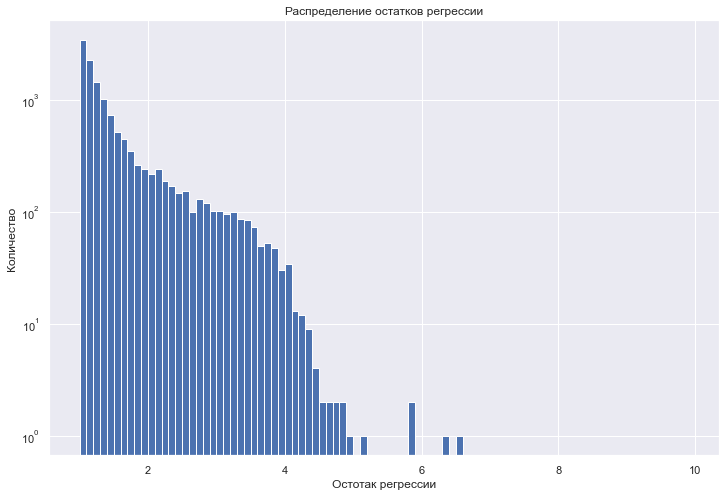

In [91]:
plt.figure(figsize=(12, 8))
plt.hist(residuals, bins = np.arange(1,10, 0.1), log = True)
plt.xlabel('Остотак регрессии')
plt.ylabel('Количество')
plt.title('Распределение остатков регрессии')
plt.show()

In [92]:
train_1['residuals'] = residuals
train_1

,id,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,log_trip_duration,weekday,months,hour,...,number_day,haversine,log_haversine,full_traffic,empty_traffic,start_in,finish_in,start_zone,finish_zone,residuals
824746,id2365163,2016-03-27 00:25:29,-73.996986,40.742210,-73.987740,40.710659,7.134891,6,3,0,...,87,3.593840,1.524716,0,0,0,0,3525,336,-0.598455
645821,id3126187,2016-03-18 20:44:12,-73.989929,40.741760,-73.977280,40.783600,6.878326,4,3,20,...,78,4.772773,1.753153,0,0,0,0,3434,7648,-0.051567
691846,id2588127,2016-04-15 18:26:12,-73.972366,40.750725,-73.861832,40.768387,7.642524,4,4,18,...,106,9.514706,2.352775,1,0,0,1,4354,-1,-0.093287
1147931,id0915715,2016-03-24 14:28:34,-73.982361,40.776901,-73.975128,40.760921,6.888572,3,3,14,...,84,1.878364,1.057222,1,0,0,0,6942,5351,-0.320726
183569,id3758776,2016-04-28 13:53:52,-73.973778,40.764374,-73.966957,40.761024,6.177944,3,4,13,...,119,0.684609,0.521533,1,0,0,0,5752,5360,-0.164432
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1348317,id2763967,2016-05-12 05:16:06,-73.996178,40.748222,-73.990967,40.755478,5.198497,3,5,5,...,133,0.918456,0.651521,0,1,0,0,4126,4832,0.490349
1154171,id0853058,2016-01-16 19:14:54,-73.995415,40.728886,-73.993706,40.744068,8.787678,5,1,19,...,16,1.694346,0.991155,1,0,0,0,2127,3629,-2.535668
617841,id2242904,2016-03-21 20:11:12,-73.960091,40.779701,-73.960136,40.773102,5.023881,0,3,20,...,81,0.733833,0.550334,0,0,0,0,7268,6568,0.418885
1048548,id2558617,2016-04-09 09:21:44,-73.968124,40.799923,-73.952415,40.818588,6.079933,5,4,9,...,100,2.460812,1.241503,0,0,0,0,9259,-1,0.101374


In [93]:
train_1 = train_1[(train_1['log_trip_duration'] > 3) &
                     (train_1['haversine'] <= 110) &
                     (train_1['residuals'] <= 5)]


In [94]:
train_1 = train_1.drop(columns=['residuals'])


Сейчас у нас очень много категориальных признаков. В категориальных признаках могут содержаться редкие категории, обычно это плохо: модель сильно переобучается на таких примерах. Для каждого категориального признака объедините действительно редкие категории в одну, если такие имеются (т.е. если категории действительно редкие). 

Я уже объеденил аэропорты в один, так что этот признак можно не объединять. Также аномалбные периоды я тоже объеденил в один. В остальных у меня нет редких категорий

Обучите модель на очищенных данных и посчитайте качество на тестовой выборке.

In [95]:
y_train = train_1["log_trip_duration"]
X_train = train_1.drop(columns=["log_trip_duration"])

y_test = test_1["log_trip_duration"]
X_test = test_1.drop(columns=["log_trip_duration"])


cat_features = ['months', 'number_day', 'anomaly', 'hour', 'empty_traffic', 'full_traffic', 'start_in', 'finish_in', 'start_zone', 'finish_zone']
num_features = ['weekday', 'log_haversine']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), num_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])


In [96]:
model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)

tr_score = rmsle(y_pred, y_test)

tr_score

0.463834187793329

**Задание 14 (1 балл)**. После OneHot-кодирования количество признаков в нашем датасете сильно возрастает. Посчитайте колиество признаков до и после кодирования категориальных признаков.

In [97]:
X_train[cat_features].shape[1]

10

In [98]:
X_train_encoded = column_transformer.fit_transform(X_train)
X_train_encoded.shape[1]

11647

Попробуйте обучить не `Ridge`-, а `Lasso`-регрессию. Какой метод лучше?

In [99]:
from sklearn.linear_model import Lasso

y_train = train_1["log_trip_duration"]
X_train = train_1.drop(columns=["log_trip_duration"])

y_test = test_1["log_trip_duration"]
X_test = test_1.drop(columns=["log_trip_duration"])


cat_features = ['months', 'number_day', 'anomaly', 'hour', 'empty_traffic', 'full_traffic', 'start_in', 'finish_in', 'start_zone', 'finish_zone']
num_features = ['weekday', 'log_haversine']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), num_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso())
])


In [100]:
model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)

tr_score = rmsle(y_pred, y_test)

tr_score

0.7943426512069055

Так как у нас все-таки много категориальных признаков и Lasso многие признаки зануляет. А Ridge дает им веса, то Rigde работает лучше 

Разбейте _обучающую выборку_ на обучающую и валидационную в отношении 8:2. По валидационной выборке подберите оптимальные значения параметра регуляризации (по логарифмической сетке) для `Ridge` и `Lasso`, на тестовой выборке измерьте качество лучшей полученной модели.

In [72]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer

y_train = train_1["log_trip_duration"]
X_train = train_1.drop(columns=["log_trip_duration"])

y_test = test_1["log_trip_duration"]
X_test = test_1.drop(columns=["log_trip_duration"])

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state = 10)

cat_features = ['months', 'number_day', 'anomaly', 'hour', 'empty_traffic', 'full_traffic', 'start_in', 'finish_in', 'start_zone', 'finish_zone']
num_features = ['weekday', 'log_haversine']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), num_features)
])

pipeline_rigde = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

pipeline_lasso = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso())
])

alphas = np.logspace(-4, 4, 30) 
param = {'regression__alpha': alphas}


rmsle_er = make_scorer(rmsle, greater_is_better = False)

ridge_grid = GridSearchCV(estimator = pipeline_rigde, param_grid = param, scoring = rmsle_er, cv = 5, n_jobs = -1)

ridge_grid.fit(X_train[cat_features + num_features], y_train)

ridge_alpha = ridge_grid.best_params_['regression__alpha']

print(f'Лучший альфа для Ridge (для провернных выше моделей): {ridge_alpha}')



Лучший альфа для Ridge (для провернных выше моделей): 32.90344562312671


In [73]:
y_pred = ridge_grid.predict(X_test[cat_features + num_features])
tr_score = rmsle(y_pred, y_test)
print(f'RMSLE для Rigde: {tr_score}')

RMSLE для Rigde: 0.47643706409937925


In [74]:
alphas = np.logspace(-4, 1, 20)
param = {'regression__alpha': alphas}

lasso_grid = GridSearchCV(estimator = pipeline_lasso, param_grid = param, scoring = rmsle_er, cv = 5, n_jobs = -1)
lasso_grid.fit(X_train[cat_features + num_features], y_train)
lasso_alpha = lasso_grid.best_params_['regression__alpha']
print(f'Лучший альфа для Lasso (для провернных выше моделей): {lasso_alpha}')


Лучший альфа для Lasso (для провернных выше моделей): 0.0001


In [75]:
y_pred = lasso_grid.predict(X_test[cat_features + num_features])
tr_score = rmsle(y_pred, y_test)
print(f'RMSLE для Lasso: {tr_score}')


RMSLE для Lasso: 0.47672451590520243


Кстати, так как коэффициент альфа для Lasso очень маленький, то нам он не зануляет много признаков. А это значит, что наши признаки линейно независимы)

Для каждого перебранного `alpha` для Lasso посчитайте количество нулевых весов в модели и нарисуйте график зависимости его от `alpha`. Как сильно придётся потерять в качестве, если мы хотим с помощью Lasso избавиться хотя бы от половины признаков?

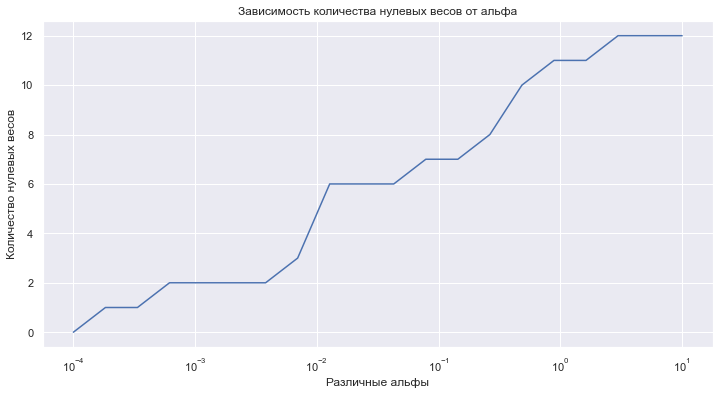

In [76]:
errors = []
zero = []
half_zero = []
for alpha in alphas:
    lasso = Lasso(alpha=alpha)
    lasso.fit(X_train[cat_features + num_features], y_train)
    x = np.sum(lasso.coef_ == 0)
    # всего 12 признаков
    if x >= 6:
        half_zero.append(rmsle(lasso.predict(X_train[cat_features + num_features]), y_train))
    zero.append(x)
    errors.append(rmsle(lasso.predict(X_train[cat_features + num_features]), y_train))

plt.figure(figsize=(12, 6))
plt.plot(alphas, zero)
plt.xscale('log')
plt.xlabel('Различные альфы')
plt.ylabel('Количество нулевых весов')
plt.title('Зависимость количества нулевых весов от альфа')
plt.grid(True)
plt.show()




In [77]:
print(f' Вот столько мы потеряем: {min(half_zero) - min(errors)}')

 Вот столько мы потеряем: 0.00912353136251376


<img src="https://www.dropbox.com/s/wp4jj0599np17lh/map_direction.png?raw=1" width="20%" align="right" style="margin-left: 20px">

**Задание 15 (1 балл)**. Часто бывает полезным использовать взаимодействия признаков (feature interactions), то есть строить новые признаки на основе уже существующих. Выше мы разбили карту Манхэттена на ячейки и придумали признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка".

Давайте попробуем сделать следующее: посчитаем, сколько раз встречается каждая возможная пара этих признаков в нашем датасете и выберем 100 самых частых пар. Закодируем поездки с этими частыми парами как категориальный признак, остальным объектам припишем -1. Получается, что мы закодировали, откуда и куда должно было ехать такси.

Также можете придумать ещё какой-нибудь способ сделать признаки про маршрут. Если эти признаки будут давать хороший прирост в качестве, то за это могут быть даны дополнительные бонусные баллы.

**Вопрос**: Почему такой признак потенциально полезный? Почему линейная модель не может самостоятельно "вытащить" эту информацию, ведь у нее в распоряжении есть признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка"?

Новый признак добавит нелинейную связь, так как у нас линейная регрессия, она не сможет правильно подобрать зависимости между этими столбцами. Полезный он тем, что покажет наиболее плотное скопление заказов.

Я специально возьму 101 первую строку, так как туда попадет значение -1 -1, а потом я его исправлю на -1 (это те, кто не из Манхэттона и не в Манхэттон)

In [101]:
def coding_pair(data):    
    pair = data.groupby(['start_zone', 'finish_zone']).size().reset_index(name='cnt')
    pair = pair.sort_values('cnt', ascending = False).head(101).reset_index()  
    pair['pair'] = pair['start_zone'].astype(str) + pair['finish_zone'].astype(str)

    data = data.merge(pair[['start_zone', 'finish_zone', 'pair']], on=['start_zone', 'finish_zone'], how='left')
    data['pair'].fillna('-1', inplace=True)
    data['pair'] = data['pair'].replace('-1-1', '-1')
    
    return data

In [102]:
train_1 = coding_pair(train_1)
test_1 = coding_pair(test_1)


Заново обучите модель (`Ridge`, если она дала более высокое качество в предыдущих экспериментах, и `Lasso` иначе) на новых даннных и посчитайте качество на тестовой выборке

Буду обучать Rigde

In [103]:
y_train = train_1["log_trip_duration"]
X_train = train_1.drop(columns=["log_trip_duration"])

y_test = test_1["log_trip_duration"]
X_test = test_1.drop(columns=["log_trip_duration"])


cat_features = ['months', 'number_day', 'anomaly', 'hour', 'empty_traffic', 'full_traffic', 'start_in', 'finish_in', 'start_zone', 'finish_zone', 'pair']
num_features = ['weekday', 'log_haversine']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), num_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

In [104]:
model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)

tr_score = rmsle(y_pred, y_test)

print(f'Score для Rigde: {tr_score}')

Score для Rigde: 0.46359487232200386


**Задание 16 (бонус, 1 балл)**. Где, как не для нашей задачи, считать манхэттенское расстояние?

**Вопрос**: Найдите, что такое манхэттенское расстояние и почему оно так называется. Как оно нам может помочь?
#### Ответ:
Манхэттенское расстояние - метрика, которая определяется так: расстояние между двумя точками равно сумме модулей разностей их координат.
По сути означает, что мы не можем ходить через стены и нам надо ходить параллельно/перпендикулярно улицам манхэттона. Нам оно может помочь тем, что мы будем правильно считать расстояние пути в манхэттоне.


Введите систему координат на нашей карте так, чтобы оси были параллельны улицам Манхэттена, и добавьте сначала в данные признак "манхэттенское расстояние между пунктом отправления и пунктом назначения", а затем и логарифм этого признака. Посчитайте корреляцию между вашим новыми признаком и таргетом; между `log_haversine` и таргетом. В каком случае корреляция больше?

Нарисуйте карту, где покажете выбранные оси. Чтобы мы могли проверить вашу работу, просьба сделать скрин этой карты и приложить картинку (если мы откроем ваш ноутбук, виджеты отображаться не будут). 

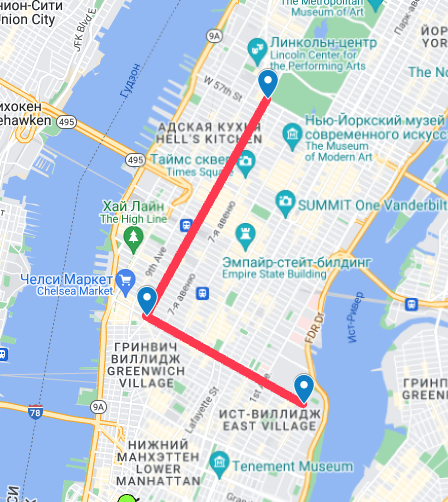

Посчитаю угол на который надо повернуть наши координаты (для этого возьму 3 точки, которые отметил на карте)

In [105]:
import math

def change_ang(long1, lat1, long2, lat2):
    
    long_delta = long2 - long1
    lat_delta = lat2 - lat1
    

    angle_rad = math.atan2(long_delta, lat_delta)
    angle_deg = math.degrees(angle_rad)
    return angle_deg

# 40.7682, -73.98197 - верхняя по y
# 40.73998, -74.00274 - начало координат
ang_change = change_ang(-74.00274, 40.73998, -73.98197, 40.7682) 
print(f' угол на который изменятся мои координаты: {ang_change}')


 угол на который изменятся мои координаты: 36.35317364732082


In [106]:
train_1.head()

,id,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,log_trip_duration,weekday,months,hour,...,number_day,haversine,log_haversine,full_traffic,empty_traffic,start_in,finish_in,start_zone,finish_zone,pair
0,id2365163,2016-03-27 00:25:29,-73.996986,40.742210,-73.987740,40.710659,7.134891,6,3,0,...,87,3.593840,1.524716,0,0,0,0,3525,336,-1
1,id3126187,2016-03-18 20:44:12,-73.989929,40.741760,-73.977280,40.783600,6.878326,4,3,20,...,78,4.772773,1.753153,0,0,0,0,3434,7648,-1
2,id2588127,2016-04-15 18:26:12,-73.972366,40.750725,-73.861832,40.768387,7.642524,4,4,18,...,106,9.514706,2.352775,1,0,0,1,4354,-1,-1
3,id0915715,2016-03-24 14:28:34,-73.982361,40.776901,-73.975128,40.760921,6.888572,3,3,14,...,84,1.878364,1.057222,1,0,0,0,6942,5351,-1
4,id3758776,2016-04-28 13:53:52,-73.973778,40.764374,-73.966957,40.761024,6.177944,3,4,13,...,119,0.684609,0.521533,1,0,0,0,5752,5360,-1


Пересчитаем координаты

In [107]:
train_1['manh_pick_lat'] = train_1['pickup_latitude'] * np.cos(ang_change) - train_1['pickup_longitude'] * np.sin(ang_change)
train_1['manh_pick_long'] = train_1['pickup_latitude'] * np.sin(ang_change) + train_1['pickup_longitude'] * np.cos(ang_change)
train_1['manh_drop_lat'] = train_1['dropoff_latitude'] * np.cos(ang_change) - train_1['dropoff_longitude'] * np.sin(ang_change)
train_1['manh_drop_long'] = train_1['dropoff_latitude'] * np.sin(ang_change) + train_1['dropoff_longitude'] * np.cos(ang_change)


train_1.head()


,id,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,log_trip_duration,weekday,months,hour,...,empty_traffic,start_in,finish_in,start_zone,finish_zone,pair,manh_pick_lat,manh_pick_long,manh_drop_lat,manh_drop_long
0,id2365163,2016-03-27 00:25:29,-73.996986,40.742210,-73.987740,40.710659,7.134891,6,3,0,...,0,0,0,3525,336,-1,-63.049956,-56.215521,-63.047977,-56.182702
1,id3126187,2016-03-18 20:44:12,-73.989929,40.741760,-73.977280,40.783600,6.878326,4,3,20,...,0,0,0,3434,7648,-1,-63.043177,-56.213508,-63.021517,-56.251474
2,id2588127,2016-04-15 18:26:12,-73.972366,40.750725,-73.861832,40.768387,7.642524,4,4,18,...,0,0,1,4354,-1,-1,-63.024057,-56.218331,-62.912367,-56.210903
3,id0915715,2016-03-24 14:28:34,-73.982361,40.776901,-73.975128,40.760921,6.888572,3,3,14,...,0,0,0,6942,5351,-1,-63.027963,-56.246077,-63.024476,-56.228887
4,id3758776,2016-04-28 13:53:52,-73.973778,40.764374,-73.966957,40.761024,6.177944,3,4,13,...,0,0,0,5752,5360,-1,-63.022390,-56.231951,-63.016488,-56.227166


In [108]:
test_1['manh_pick_lat'] = test_1['pickup_latitude'] * np.cos(ang_change) - test_1['pickup_longitude'] * np.sin(ang_change)
test_1['manh_pick_long'] = test_1['pickup_latitude'] * np.sin(ang_change) + test_1['pickup_longitude'] * np.cos(ang_change)
test_1['manh_drop_lat'] = test_1['dropoff_latitude'] * np.cos(ang_change) - test_1['dropoff_longitude'] * np.sin(ang_change)
test_1['manh_drop_long'] = test_1['dropoff_latitude'] * np.sin(ang_change) + test_1['dropoff_longitude'] * np.cos(ang_change)


test_1.head()


,id,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,log_trip_duration,weekday,months,hour,...,empty_traffic,start_in,finish_in,start_zone,finish_zone,pair,manh_pick_lat,manh_pick_long,manh_drop_lat,manh_drop_long
0,id2631171,2016-01-23 00:09:14,-74.006615,40.731712,-73.991890,40.727161,6.493754,5,1,0,...,0,0,0,2414,2031,-1,-63.061682,-56.207434,-63.048343,-56.199714
1,id2892416,2016-02-10 19:24:14,-73.963203,40.777924,-74.004059,40.747654,7.514255,2,2,19,...,0,0,0,7064,4017,-1,-63.009060,-56.242802,-63.055636,-56.222404
2,id3095142,2016-05-12 06:39:26,-73.987595,40.719822,-74.010994,40.716148,6.196444,3,5,6,...,0,0,0,1236,909,-1,-63.045792,-56.191602,-63.069422,-56.193238
3,id3803823,2016-01-21 08:31:03,-73.969055,40.763618,-73.974129,40.778679,6.643790,3,1,8,...,0,0,0,5657,7152,-1,-63.017954,-56.230162,-63.019542,-56.245975
4,id3155730,2016-01-02 13:12:33,-73.950165,40.775635,-73.944534,40.779636,5.298317,5,1,13,...,0,0,0,6879,7286,-1,-62.996860,-56.237664,-62.990479,-56.240309


In [109]:
train_1['manh_dist'] = abs(train_1['manh_drop_lat'] - train_1['manh_pick_lat']) + abs(train_1['manh_drop_long'] - train_1['manh_pick_long'])
train_1['log_manh_dist'] = np.log1p(train_1['manh_dist'])

train_1.head()




,id,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,log_trip_duration,weekday,months,hour,...,finish_in,start_zone,finish_zone,pair,manh_pick_lat,manh_pick_long,manh_drop_lat,manh_drop_long,manh_dist,log_manh_dist
0,id2365163,2016-03-27 00:25:29,-73.996986,40.742210,-73.987740,40.710659,7.134891,6,3,0,...,0,3525,336,-1,-63.049956,-56.215521,-63.047977,-56.182702,0.034798,0.034206
1,id3126187,2016-03-18 20:44:12,-73.989929,40.741760,-73.977280,40.783600,6.878326,4,3,20,...,0,3434,7648,-1,-63.043177,-56.213508,-63.021517,-56.251474,0.059626,0.057916
2,id2588127,2016-04-15 18:26:12,-73.972366,40.750725,-73.861832,40.768387,7.642524,4,4,18,...,1,4354,-1,-1,-63.024057,-56.218331,-62.912367,-56.210903,0.119118,0.112541
3,id0915715,2016-03-24 14:28:34,-73.982361,40.776901,-73.975128,40.760921,6.888572,3,3,14,...,0,6942,5351,-1,-63.027963,-56.246077,-63.024476,-56.228887,0.020678,0.020467
4,id3758776,2016-04-28 13:53:52,-73.973778,40.764374,-73.966957,40.761024,6.177944,3,4,13,...,0,5752,5360,-1,-63.022390,-56.231951,-63.016488,-56.227166,0.010688,0.010631


In [110]:
test_1['manh_dist'] = abs(test_1['manh_drop_lat'] - test_1['manh_pick_lat']) + abs(test_1['manh_drop_long'] - test_1['manh_pick_long'])
test_1['log_manh_dist'] = np.log1p(test_1['manh_dist'])

test_1.head()


,id,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,log_trip_duration,weekday,months,hour,...,finish_in,start_zone,finish_zone,pair,manh_pick_lat,manh_pick_long,manh_drop_lat,manh_drop_long,manh_dist,log_manh_dist
0,id2631171,2016-01-23 00:09:14,-74.006615,40.731712,-73.991890,40.727161,6.493754,5,1,0,...,0,2414,2031,-1,-63.061682,-56.207434,-63.048343,-56.199714,0.021059,0.020840
1,id2892416,2016-02-10 19:24:14,-73.963203,40.777924,-74.004059,40.747654,7.514255,2,2,19,...,0,7064,4017,-1,-63.009060,-56.242802,-63.055636,-56.222404,0.066974,0.064827
2,id3095142,2016-05-12 06:39:26,-73.987595,40.719822,-74.010994,40.716148,6.196444,3,5,6,...,0,1236,909,-1,-63.045792,-56.191602,-63.069422,-56.193238,0.025266,0.024952
3,id3803823,2016-01-21 08:31:03,-73.969055,40.763618,-73.974129,40.778679,6.643790,3,1,8,...,0,5657,7152,-1,-63.017954,-56.230162,-63.019542,-56.245975,0.017400,0.017251
4,id3155730,2016-01-02 13:12:33,-73.950165,40.775635,-73.944534,40.779636,5.298317,5,1,13,...,0,6879,7286,-1,-62.996860,-56.237664,-62.990479,-56.240309,0.009026,0.008986


In [111]:
manh_cor = train_1['log_manh_dist'].corr(train_1['log_trip_duration'])
earth_cor = train_1['log_haversine'].corr(train_1['log_trip_duration'])
print(f' Корелляция между log манхэттоновским расстоянием и таргетом: {manh_cor}')
print(f' Корелляция между log расстоянием и таргетом: {earth_cor}')



 Корелляция между log манхэттоновским расстоянием и таргетом: 0.6296830872355781
 Корелляция между log расстоянием и таргетом: 0.7554312246679066


Заново обучите модель на новых даннных и посчитайте качество на тестовой выборке. Стало ли лучше? Объясните полученный результат.

In [114]:
y_train = train_1["log_trip_duration"]
X_train = train_1.drop(columns=["log_trip_duration"])

y_test = test_1["log_trip_duration"]
X_test = test_1.drop(columns=["log_trip_duration"])


cat_features = ['months', 'number_day', 'anomaly', 'hour', 'empty_traffic', 'full_traffic', 'start_in', 'finish_in', 'start_zone', 'finish_zone', 'pair']
num_features = ['weekday', 'log_haversine', 'log_manh_dist']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), num_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

In [115]:
model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)

tr_score = rmsle(y_pred, y_test)

print(f'Score для Rigde: {tr_score}')

Score для Rigde: 0.45541939569567363


Стало лучше! Улучшение есть, так как маршрут в Манхэттоне явно можно вычислять, используя данное расстояние. Но я думаю прям сильного буста нет, так как все-таки эти признаки зависимы между собой, сейчас я это и проверю!

In [116]:
print(train_1['log_haversine'].corr(train_1['log_manh_dist']))


0.9044861771642144


Ну вот, что я и говорил

А что с Lasso?

In [118]:
y_train = train_1["log_trip_duration"]
X_train = train_1.drop(columns=["log_trip_duration"])

y_test = test_1["log_trip_duration"]
X_test = test_1.drop(columns=["log_trip_duration"])


cat_features = ['months', 'number_day', 'anomaly', 'hour', 'empty_traffic', 'full_traffic', 'start_in', 'finish_in', 'start_zone', 'finish_zone', 'pair']
num_features = ['weekday', 'log_haversine', 'log_manh_dist']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), num_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso())
])

In [119]:
model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)

tr_score = rmsle(y_pred, y_test)

print(f'Score для Lasso: {tr_score}')

Score для Lasso: 0.7943426512069055


Ну в принципе ошибка примерно такая же, как и у Ridge

**Задание 17 (бонус, 2 балла)**. Реализуйте трансформер, который строит разбиение карты по шестигранной решётке с помощью библиотеки [H3](https://github.com/uber/h3-py) и вычисляет признаки на основе такого разбиения.

Признаки могут быть самые разные: расстояние между точкой старта и финиша, посчитанное в количестве шестиугольников; статистика по числу поездок и по их продолжительности в соседних шестиугольниках.

Важно: производительность библиотеки существенно зависит от количества шестиугольников на карте (определяется параметром resolution). Подберите такое разрешение, при котором ваш код будет работать за приемлемое время.

При построении признаков старайтесь не допустить утечки целевой переменной (подробнее про это можно почитать в материалах 1-го семинара) — в противном случае хорошего качества на тестовой выборке достичь не получится.

Измерьте качество после добавления новых признаков. За улучшение функционала ошибки на каждые 0.005 на тестовой выборке будет даваться 0.5 бонусных балла. Можно получить до 2 бонусных баллов за это задание.

In [94]:
# !pip install h3

In [120]:
import h3
from h3 import h3

In [121]:

class H3Transformer(BaseEstimator, TransformerMixin):
    def __init__(self, resolution = 9):
        self.resolution = resolution

    def show_map(self, h3_idx, X, color="blue"):
        
        location = (X['pickup_latitude'].mean(), X['pickup_longitude'].mean())  

        
        m = folium.Map(location=location)

        for i in h3_idx:
            h3_coord = h3.h3_to_geo_boundary(i)
            folium.Polygon(locations=h3_coord, color=color, fill=True).add_to(m)

        return m
    
    def fit(self, X, y=None):
        return self 

    def transform(self, X):
        X_new = X.copy()
        X_new['h3_pick'] = np.vectorize(h3.geo_to_h3)(X_new['pickup_latitude'], X_new['pickup_longitude'], self.resolution)
        X_new['h3_drop'] = np.vectorize(h3.geo_to_h3)(X_new['dropoff_latitude'], X_new['dropoff_longitude'], self.resolution)

        X_new['h3_dist'] = np.vectorize(h3.h3_distance)(X_new['h3_pick'], X_new['h3_drop'])
        X_new['log_h3_dist'] = np.log1p(X_new['h3_dist'])
        
        # Cделаю новый категориальный признак - частота поездок внутри гексагонов. Так как у нас сильное разбиение, то возьму первые 10000 самых частых пар (начало и конец по гексагонам)
        
        pair = X_new.groupby(['h3_pick', 'h3_drop']).size().reset_index(name='cnt')
        pair = pair.sort_values('cnt', ascending = False).head(50000).reset_index()  
        pair['h3_pair'] = pair['h3_pick'].astype(str) + pair['h3_drop'].astype(str)

        X_new = X_new.merge(pair[['h3_pick', 'h3_drop', 'h3_pair']], on=['h3_pick', 'h3_drop'], how='left')
        X_new['h3_pair'].fillna('-1', inplace=True)

        return X_new
    
    

In [122]:
trans_2 = H3Transformer(resolution = 9)
train_1 = trans_2.transform(train_1)
test_1 = trans_2.transform(test_1)

train_1.head()

,id,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,log_trip_duration,weekday,months,hour,...,manh_pick_long,manh_drop_lat,manh_drop_long,manh_dist,log_manh_dist,h3_pick,h3_drop,h3_dist,log_h3_dist,h3_pair
0,id2365163,2016-03-27 00:25:29,-73.996986,40.742210,-73.987740,40.710659,7.134891,6,3,0,...,-56.215521,-63.047977,-56.182702,0.034798,0.034206,892a100d247ffff,892a1072dc7ffff,12,2.564949,-1
1,id3126187,2016-03-18 20:44:12,-73.989929,40.741760,-73.977280,40.783600,6.878326,4,3,20,...,-56.213508,-63.021517,-56.251474,0.059626,0.057916,892a100d20bffff,892a1008b97ffff,16,2.833213,892a100d20bffff892a1008b97ffff
2,id2588127,2016-04-15 18:26:12,-73.972366,40.750725,-73.861832,40.768387,7.642524,4,4,18,...,-56.218331,-62.912367,-56.210903,0.119118,0.112541,892a100d62fffff,892a100e253ffff,29,3.401197,892a100d62fffff892a100e253ffff
3,id0915715,2016-03-24 14:28:34,-73.982361,40.776901,-73.975128,40.760921,6.888572,3,3,14,...,-56.246077,-63.024476,-56.228887,0.020678,0.020467,892a1008babffff,892a100d603ffff,6,1.945910,892a1008babffff892a100d603ffff
4,id3758776,2016-04-28 13:53:52,-73.973778,40.764374,-73.966957,40.761024,6.177944,3,4,13,...,-56.231951,-63.016488,-56.227166,0.010688,0.010631,892a100d61bffff,892a100d617ffff,2,1.098612,892a100d61bffff892a100d617ffff


In [203]:
m = trans_2.show_map(train_1['h3_pick'].sample(300).tolist(), train_1)
m

In [123]:
y_train = train_1["log_trip_duration"]
X_train = train_1.drop(columns=["log_trip_duration"])

y_test = test_1["log_trip_duration"]
X_test = test_1.drop(columns=["log_trip_duration"])


cat_features = ['months', 'number_day', 'anomaly', 'hour', 'empty_traffic', 'full_traffic', 'start_in', 'finish_in', 'start_zone', 'finish_zone', 'pair', 'h3_pick', 'h3_drop', 'h3_pair']
num_features = ['log_haversine', 'log_manh_dist', 'weekday', 'log_h3_dist']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), num_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

In [124]:
model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)

tr_score = rmsle(y_pred, y_test)

print(f'Score для Ridge: {tr_score}')

Score для Ridge: 0.4320772269661488


Вот насколько я выиграл:

In [207]:
0.45971215421552447 - 0.4355870244532193

0.024125129762305186

Сюююда. Сейчас еще попробую лучшую альфу подобрать)

In [125]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer

y_train = train_1["log_trip_duration"]
X_train = train_1.drop(columns=["log_trip_duration"])

y_test = test_1["log_trip_duration"]
X_test = test_1.drop(columns=["log_trip_duration"])

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state = 10)

cat_features = ['months', 'number_day', 'anomaly', 'hour', 'empty_traffic', 'full_traffic', 'start_in', 'finish_in', 'start_zone', 'finish_zone', 'pair', 'h3_pick', 'h3_drop', 'h3_pair']
num_features = ['log_haversine', 'log_manh_dist', 'weekday', 'log_h3_dist']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), num_features)
])

pipeline_rigde = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])


alphas = np.logspace(-1, 1, 30) 
param = {'regression__alpha': alphas}


rmsle_er = make_scorer(rmsle, greater_is_better = False)

ridge_grid = GridSearchCV(estimator = pipeline_rigde, param_grid = param, scoring = rmsle_er, cv = 5, n_jobs = -1)

ridge_grid.fit(X_train[cat_features + num_features], y_train)
new_ridge_alpha = ridge_grid.best_params_['regression__alpha']

print(f'Лучший альфа для Ridge: {new_ridge_alpha}')



Лучший альфа для Ridge: 3.856620421163472


In [ ]:
y_train = train_1["log_trip_duration"]
X_train = train_1.drop(columns=["log_trip_duration"])

y_test = test_1["log_trip_duration"]
X_test = test_1.drop(columns=["log_trip_duration"])


cat_features = ['months', 'number_day', 'anomaly', 'hour', 'empty_traffic', 'full_traffic', 'start_in', 'finish_in', 'start_zone', 'finish_zone', 'pair', 'h3_pick', 'h3_drop', 'h3_pair']
num_features = ['log_haversine', 'log_manh_dist', 'weekday', 'log_h3_dist']

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), cat_features),
    ('scaling', StandardScaler(), num_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(alpha = new_ridge_alpha))
])

model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)

tr_score = rmsle(y_pred, y_test)

print(f'Score для Ridge: {tr_score}')

In [211]:
0.45971215421552447 - 0.43532784820219356

0.024384306013330914

Вот такой конечный прирост получился (это прирост чисто последнего бонуса)

Вставьте картинку, описывающую ваш опыт выполнения этого ДЗ.

### Сижу смарю на числа

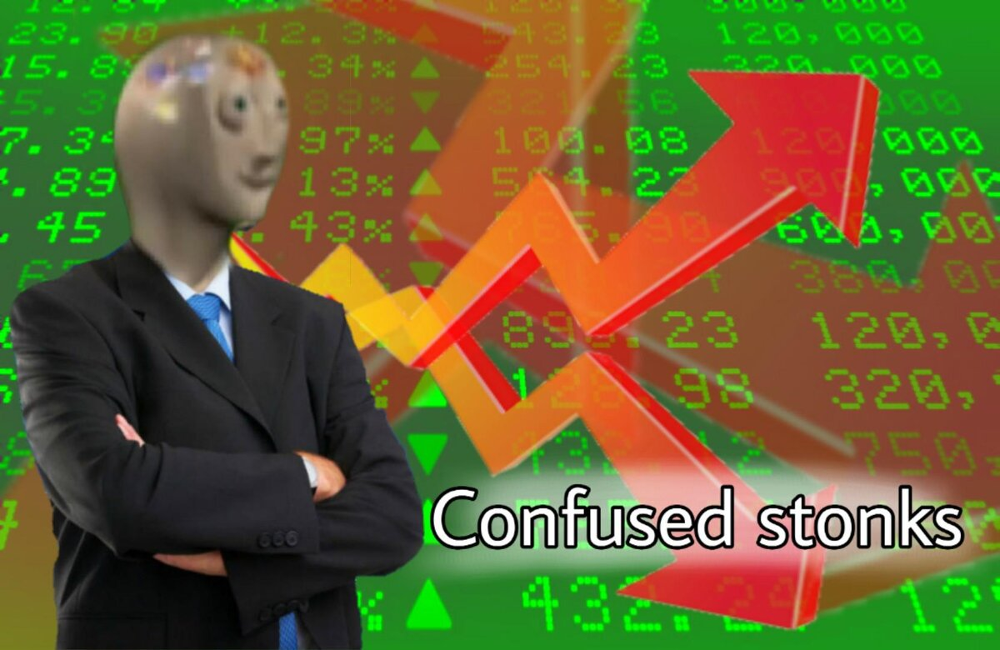